# ICON-NorESM Lifecylce Analysis

# Import packages

In [1]:
%load_ext autoreload
%autoreload 2
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.path as mpath
import matplotlib.cm as cm
import matplotlib.patches as mpatches
from matplotlib.patches import Rectangle
from matplotlib.patches import Circle
import matplotlib.colors as mcolors
import cartopy.feature
import numpy as np
import pandas as pd
import scipy
import datetime
import cartopy
from metpy.units import units
import cartopy.crs as ccrs
import pickle
import os
import glob
import subprocess
import dask
from joblib import Parallel, delayed
from geopy.distance import distance 
import cmocean as cmo
import cmcrameri.cm as cmc
from matplotlib.colors import TwoSlopeNorm

import concurrent.futures

### Load MOAAP functions
import sys
sys.path.append('/work/aa0049/a271122/MOAAP/MOAAP/')
from src.utils import *
from src.Corrections import * 
from src.Enumerations import Month, Season, Experiments, Domains
from src.xarray_util import create_obj_from_dict,  ObjectContainer,  load_tracking_objects
from src.plot_funcs import plot_contourf_rotated_grid #, plot_unstructured_rotated_grid

from src.GridPoints import Domain

/work/aa0049/a271122/MOAAP/MOAAP/src/xarray_util.py:28: AccessorRegistrationWarning: registration of accessor <class 'src.xarray_util.Accessor'> under name 'get' for type <class 'xarray.core.dataset.Dataset'> is overriding a preexisting attribute with the same name.
  class Accessor:


In [34]:
### Load my functions
from ICON_utils import *

In [35]:
plt.rcParams.update({
    'axes.titlesize': 13,        # Title size
    'axes.labelsize': 12,         # Axis label size
    'lines.linewidth': 2,         # Line width
    'lines.markersize': 7,       # Marker size for lines
    'xtick.labelsize': 10,        # X-tick label size
    'ytick.labelsize': 10         # Y-tick label size
})

In [36]:
dask.config.set(**{'array.slicing.split_large_chunks': True})

In [37]:
ICON_NorESM_path = '/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/historical/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/1hr/'

In [38]:
ICON_NorESM_path_ssp = '/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/1hr/'

In [39]:
ICON_clim_path = '/work/aa0049/a271122/ICON_NorESM/'

# Load Objects

In [8]:
ds=xr.open_dataset('/work/aa0049/a271041/spice-v2.1/chain/work/run_era5_polarres_wp3_hindcast2/post/yearly/T_2M/T_2M_2020010100-2020123123.ncz')

# extract the rotated coordinate system
crs_rot = ccrs.RotatedPole(pole_longitude=ds.rotated_pole.attrs['grid_north_pole_longitude'],\
                           pole_latitude=ds.rotated_pole.attrs['grid_north_pole_latitude'])

In [9]:
# Use surface pressure as approximate land sea mask
#ds_ps = xr.open_dataset('/work/aa0049/a271041/CMOR_attr/ARC-11/AWI/NorESM2-MM/historical/r1i1p1f1/AWI-ICON-2024-01/v1/mon/ps/ps_ARC-11_NorESM2-MM_historical_r1i1p1f1_AWI-ICON-2024-01_v1_mon_198501-198512.nc')
#ps = ds_ps['ps'].mean(dim='time')

#Land/lake mask
ds_land = xr.open_dataset('/work/aa0049/a271109/spice-v2.2/chain/work/polarres_wp3_cmip_CNRM_ssp370/post/yearly/FR_LAND/FR_LAND.ncz')
ds_lake = xr.open_dataset('/work/aa0049/a271109/spice-v2.2/chain/work/polarres_wp3_cmip_CNRM_ssp370/post/yearly/FR_LAKE/FR_LAKE.ncz')

In [ ]:
exp_ICON_NORESM_CONTROL=Experiments.ICON_NORESM_CONTROL.value
input_path_ICON_NORESM_CONTROL= exp_ICON_NORESM_CONTROL.IVTobj_out_path
type_='IVT'
input_file_name_temp_ICON_NORESM_CONTROL = 'MOAPP_ICON_100and85controlperc_remapped_3x'
first_year = 1984
last_year = 2014
num_years = last_year-first_year

objs = load_tracking_objects(input_path_ICON_NORESM_CONTROL,
                                      input_file_name_temp_ICON_NORESM_CONTROL,
                                      type_, first_year,
                                      last_year,
                                      load_coordinates=True,
                                      load_clusters=True,
                                      exp=exp_ICON_NORESM_CONTROL,                                                                
                                      )

In [10]:
with open('/work/aa0049/a271122/MOAAP/IVT_Tracking/NorESM_ssp_remapped_3x/Object_container_1984-2014_all.pkl', 'rb') as f:
   objs = pickle.load(f) 


In [ ]:
df_objs=define_df_objs(objs)
df_objs

# Define custom sectors for selection

In [11]:
from enum import Enum

class Domains(Enum):
    NORTH_ATLANTIC = Domain(north=70, south=50, east=0, west=-60)
    NORTH_PACIFIC = Domain(north=70, south=40, east=-140, west=160)
    CENTRAL_ARCTIC = Domain(north=90, south=70, east=180, west=-180)
    FRAM_STRAIT = Domain(north=81, south=77, east=10, west=-10)
    GREENLAND_SEA = Domain(north=80, south=75, east=10, west=-20)
    BERING_STRAIT = Domain(north=70, south=65, east=-150, west=160)
    BAFFIN_BAY = Domain(north=75, south=65, east=-55, west=-80)
    ARCTIC_ENTRANCE_NA = Domain(north=72, south=69, east=20, west=-25)
    NORTH_AMERICA = Domain(north=70, south=60, east=-80, west=-140)
    SIBERIA = Domain(north=70, south=60, east=135, west=75)

    # JLa custom domains
    NORTH_ATLANTIC_JLa = Domain(north=80, south=67, east=60, west=-30)
    BEAUFORT_SIBERIAN_JLa = Domain(north=80, south=70, east=-120, west=120)
    CENTRAL_ARCTIC_JLa = Domain(north=90, south=80, east=180, west=-180)




# Define new domain values
NORTH_ATLANTIC_JLa = Domain(north=80, south=67, east=60, west=-30)
BEAUFORT_SIBERIAN_JLa = Domain(north=80, south=70, east=120, west=-120)
CENTRAL_ARCTIC_JLa = Domain(north=90, south=80, east=180, west=-180)
BARENTS_KARA_SEA = Domain(north=82, south=70, east=90, west=20)



gridspacing=0.75
lat=np.arange(-90, 90+gridspacing,gridspacing)
lon=np.arange(-180, 180+gridspacing,gridspacing)
ds_dummy = xr.Dataset({"dummy": (("lat", "lon"), np.ones([len(lat), len(lon)]))},coords={"lon": lon,"lat": lat})


dd=ds_dummy.copy()
mask_domain_CentralArctic=dd.dummy.where(dd.lat>80).notnull()
mask_domain_NorthAtlantic=dd.dummy.where((dd.lat<=80) & (dd.lat>67) & (dd.lon>-30) & (dd.lon<60)).notnull()
mask_domain_BeaufortSiberianSea1=dd.dummy.where((dd.lat<=80) & (dd.lat>70) & (dd.lon>120)).notnull()
mask_domain_BeaufortSiberianSea2=dd.dummy.where((dd.lat<=80) & (dd.lat>70) & (dd.lon<-120)).notnull()

mask_domain_BeaufortSiberianSea = mask_domain_BeaufortSiberianSea1 | mask_domain_BeaufortSiberianSea2

mask_domains = {
    "CentralArctic": {"mask": mask_domain_CentralArctic, "color": 'darkred',"north":90,"south":80,"east":180,"west":-180},
    "NorthAtlantic": {"mask": mask_domain_NorthAtlantic, "color": 'darkblue',"north":80,"south":67,"east":60,"west":-30},
    "BeaufortSiberianSea": {"mask": mask_domain_BeaufortSiberianSea, "color": "gold","north":80,"south":70,"east":120,"west":-120},
}
domains = ["NorthAtlantic","CentralArctic","BeaufortSiberianSea"]

In [12]:
def sel_all_objects(objs,season):
    
    objs_sel = objs.sel_season(Season[season])
    
    ids_sel=[ds.id_.item() for ds in objs_sel]

    return objs_sel, ids_sel

In [75]:
objs_sel, ids_sel = sel_objs(objs,season='DJF')

In [76]:
#DJF 
objs_sel_tc = extract_and_transform_rot_coords(objs_sel)

In [16]:
#DJF
objs_final = create_final_objs(objs_sel_tc)

10


In [21]:
for i in range(len(objs_final)):
    for t in objs_final[i].times:
        if t.dt.month == 3:
            print(str(i)+": MARCH")
            break


In [20]:
#objs_final.pop(4)

<xarray.Dataset>
Dimensions:          (times: 198)
Coordinates:
  * times            (times) datetime64[ns] 1999-02-26T20:00:00 ... 1999-03-0...
Data variables: (12/17)
    id_              <U6 '150538'
    exp              object <class 'src.Experiments_infos.ICON_NorESM_CONTROL'>
    size             (times) float64 1.061e+06 1.119e+06 ... 6.571e+03 3.279e+03
    total_IVT        (times) float32 1.508e+05 1.652e+05 ... 612.0 302.2
    mean_IVT         (times) float32 146.4 151.4 155.1 ... 103.0 102.0 100.7
    max_IVT          (times) float32 245.1 301.0 326.7 ... 106.3 103.8 101.2
    ...               ...
    gridpoints       (times) object [RotatedGridPoint(lat=12.399999618530273,...
    clusters         (times) <U11 'WINTER-SCAN' 'WINTER-SCAN' ... 'SPRING-ATL+'
    lat              (times) float32 21.7 22.3 22.6 22.6 ... -9.2 -9.8 -10.4
    lon              (times) float32 -2.6 -2.6 -2.6 -2.3 ... -0.8 -0.5 0.1 0.4
    geo_lat          (times) float64 74.64 74.05 73.76 ... 74.24 73.65 73.05
    geo_lon          (times) float64 9.158 8.786 8.61 ... 178.2 -179.6 -178.7

In [17]:
#Select all dates in which an event appeared 
objs_times=[ds.times for ds in objs_final]

#Combine all dates in a data array 
objs_all_times = xr.concat(objs_times, dim='times').sortby('times').drop_duplicates(dim='times')


#Select all dates in which objects are in specific domains 
NA_combined_times, CA_combined_times, BS_combined_times = combine_times(objs_final)

Text(0.0, 1.0, 'ICON+NorESM2-MM 1983-2014')

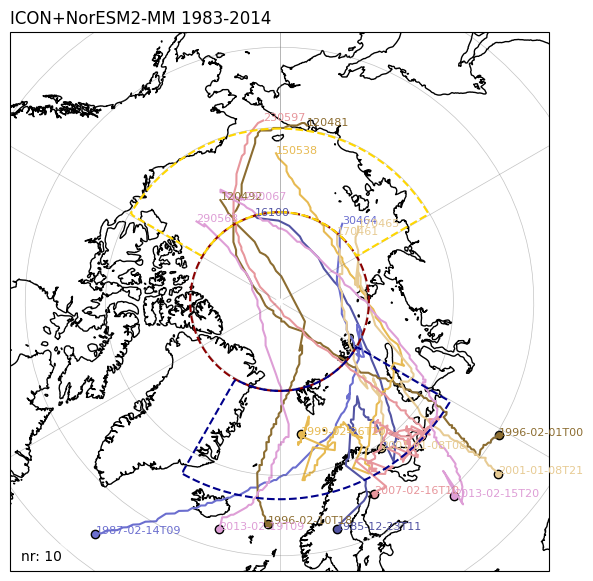

In [18]:
fig,ax=plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(7,7)) #    

objs_nr=len(objs_final)

for i in range(objs_nr):
    track=objs_final[i].track.values
    
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])  

    if isinstance(df_objs, pd.DataFrame):
        obj_id=objs_final[i]['id_'].item()
        obj_color=df_objs[df_objs['id'] == obj_id].color.item()
        ax.text(track_lons[-1],track_lats[-1],obj_id,fontsize=8,\
                transform=crs_rot,color=obj_color,zorder=11)
        ax.text(track_lons[0],track_lats[0],str(objs_final[i]['times'][0].values.astype('datetime64[h]')),fontsize=8,\
                transform=crs_rot,color=obj_color,zorder=11)
        ax.scatter(track_lons[0],track_lats[0],facecolor=obj_color,edgecolor='k',transform=crs_rot)
        ax.plot(track_lons,track_lats,color=obj_color,transform=crs_rot) 

ax.coastlines()
ax.set_extent([-180,180, 58, 90], crs=ccrs.PlateCarree())
ax.gridlines(linewidth=0.5,color='dimgray',alpha=0.4,zorder=2)

for domain_name, domain_data in mask_domains.items():
    domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1.5,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())

ax.text(0.02,0.02,f'nr: {objs_nr}',transform=ax.transAxes,\
       bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

ax.set_title('ICON+NorESM2-MM 1983-2014',loc='left')

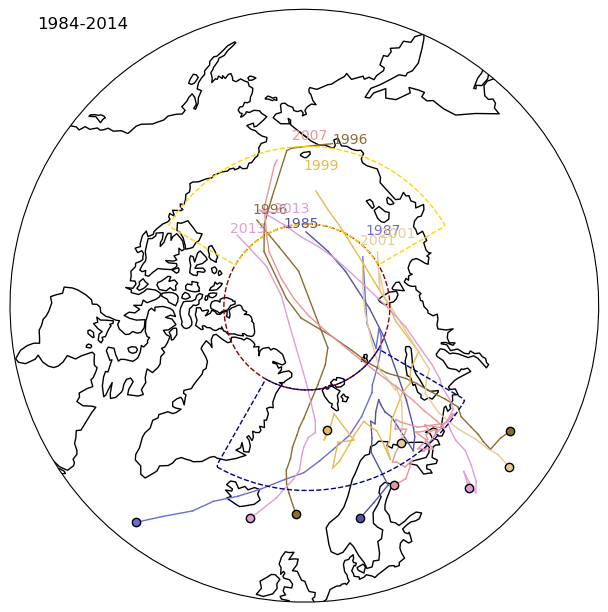

In [60]:
fig,ax=plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(7,7)) #    

objs_nr=len(objs_final)

for i in range(objs_nr):
    track = objs_final[i].track.values
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])  

    if isinstance(df_objs, pd.DataFrame):
        obj_id = objs_final[i]['id_'].item()
        obj_color = df_objs[df_objs['id'] == obj_id].color.item()
        
        # Only once per object
        ax.text(track_lons[-1], track_lats[-1],
                str(pd.to_datetime(objs_final[i].times[0].values).strftime('%Y')),
                fontsize=10, transform=crs_rot, color=obj_color, zorder=12)

        ax.scatter(track_lons[0], track_lats[0],
                   facecolor=obj_color, edgecolor='k',
                   transform=crs_rot, zorder=12)

        # Now draw the lines
        for j in range(0, len(track_lats) - 6, 6):
            lat_start = track_lats[j]
            lon_start = track_lons[j]
            lat_end = track_lats[j + 6]
            lon_end = track_lons[j + 6]
            ax.plot([lon_start, lon_end], [lat_start, lat_end],
                    color=obj_color, transform=crs_rot, linewidth=1)
ax.coastlines()
ax.set_extent([-180, 180, 55, 90], crs=ccrs.PlateCarree())
#ax.gridlines(linewidth=0.5, color='dimgray', alpha=0.4, zorder=2)

center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

for domain_name, domain_data in mask_domains.items():
    domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())


ax.set_title('1984-2014',loc='left')
plt.savefig('/work/aa0049/a271122/ICON_NorESM/tracks_historical.png',dpi=300)

plt.show()


#### SSP

In [52]:
'''exp_ICON_NORESM_SSP=Experiments.ICON_NORESM_SSP.value
input_path_ICON_NORESM_SSP= exp_ICON_NORESM_SSP.IVTobj_out_path
type_='IVT'
input_file_name_temp_ICON_NORESM_SSP = 'MOAPP_ICON_100and85NorESMsspperc_remapped_3x'
first_year = 2015
last_year = 2099
num_years = last_year-first_year

objs_ssp = load_tracking_objects(input_path_ICON_NORESM_SSP,
                                      input_file_name_temp_ICON_NORESM_SSP,
                                      type_, first_year,
                                      last_year,
                                      load_coordinates=True,
                                      load_clusters=True,
                                      exp=exp_ICON_NORESM_SSP,                                                                
                                      )'''

/work/aa0238/a271093/results/MOAAP/IVT_Tracking/NorESM_ssp_remapped_3x/Object_container_2015-2099_withClusters exists. Loading...


In [53]:
#with open('/work/aa0049/a271122/MOAAP/IVT_Tracking/NorESM_ssp_remapped_3x/Object_container_ssp_all_withClusters.pkl', 'wb') as f:
#        pickle.dump(objs_ssp, f)

In [11]:
with open('/work/aa0049/a271122/MOAAP/IVT_Tracking/NorESM_ssp_remapped_3x/Object_container_ssp_all_withClusters.pkl', 'rb') as f:
   objs_ssp = pickle.load(f) 


In [12]:
objs_sel_ssp, ids_sel_ssp = sel_objs(objs_ssp,season='DJF')

In [13]:
objs_sel_tc_ssp = extract_and_transform_rot_coords(objs_sel_ssp)
objs_final_ssp = create_final_objs(objs_sel_tc_ssp)

29


In [13]:
for i in range(len(objs_final_ssp)):
    for t in objs_final_ssp[i].times:
        if t.dt.month == 3:
            print(str(i)+": MARCH")
            break


12: MARCH


In [14]:
objs_final_ssp.pop(12)


<xarray.Dataset>
Dimensions:          (times: 195)
Coordinates:
  * times            (times) datetime64[ns] 2096-02-26T11:00:00 ... 2096-03-0...
Data variables: (12/17)
    id_              <U6 '820686'
    exp              object <class 'src.Experiments_infos.ICON_NorESM_SSP'>
    size             (times) float64 1.267e+05 1.568e+05 ... 4.105e+04 2.107e+04
    total_IVT        (times) float32 2.89e+04 3.803e+04 ... 3.877e+03 1.947e+03
    mean_IVT         (times) float32 224.0 237.7 251.9 ... 109.6 104.8 102.4
    max_IVT          (times) float32 310.0 353.3 388.9 ... 132.3 110.5 104.3
    ...               ...
    gridpoints       (times) object [RotatedGridPoint(lat=25.299999237060547,...
    clusters         (times) <U32 'WINTER-NAO+' 'WINTER-NAO+' ... 'SPRING-NAO+'
    lat              (times) float32 28.0 28.0 28.3 28.0 ... -1.7 -2.3 -3.5 -3.8
    lon              (times) float32 26.8 26.5 26.2 25.3 ... 4.3 4.6 7.9 8.8
    geo_lat          (times) float64 56.77 56.99 57.03 ... 80.03 77.22 76.42
    geo_lon          (times) float64 -46.6 -46.32 -45.59 ... -141.7 -139.4

In [12]:
with open('/work/aa0049/a271122/MOAAP/IVT_Tracking/NorESM_ssp_remapped_3x/Object_container_2070-2099_withClusters_filtered.pkl', 'rb') as f:
    objs_final_ssp = pickle.load(f)

In [17]:
#objs_final_ssp = objs_final_ssp[15:30]

In [15]:
#Select all dates in which an event appeared 
objs_times_ssp=[ds.times for ds in objs_final_ssp]

#Combine all dates in a data array 
objs_all_times_ssp = xr.concat(objs_times_ssp, dim='times').sortby('times').drop_duplicates(dim='times')


In [16]:
df_objs_ssp=define_df_objs(objs_final_ssp)
df_objs_ssp

,id,color
0,560444,"(0.2235294117647059, 0.23137254901960785, 0.47..."
1,560580,"(0.3215686274509804, 0.32941176470588235, 0.63..."
2,570491,"(0.611764705882353, 0.6196078431372549, 0.8705..."
3,600667,"(0.38823529411764707, 0.4745098039215686, 0.22..."
4,660395,"(0.7098039215686275, 0.8117647058823529, 0.419..."
5,696490,"(0.807843137254902, 0.8588235294117647, 0.6117..."
6,720499,"(0.7411764705882353, 0.6196078431372549, 0.223..."
7,746544,"(0.9058823529411765, 0.7294117647058823, 0.321..."
8,766470,"(0.5176470588235295, 0.23529411764705882, 0.22..."
9,786538,"(0.6784313725490196, 0.28627450980392155, 0.29..."


Text(0.0, 1.0, 'ICON+NorESM2-MM 2015-2099')

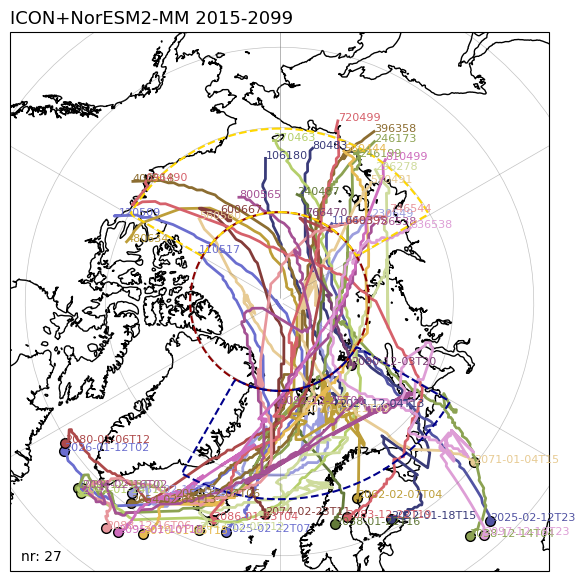

In [15]:
fig,ax=plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(7,7)) #    

objs_nr=len(objs_final_ssp)

for i in range(objs_nr):
    track=objs_final_ssp[i].track.values
    
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])  

    if isinstance(df_objs_ssp, pd.DataFrame):
        obj_id=objs_final_ssp[i]['id_'].item()
        obj_color=df_objs_ssp[df_objs_ssp['id'] == obj_id].color.item()
        ax.text(track_lons[-1],track_lats[-1],obj_id,fontsize=8,\
                transform=crs_rot,color=obj_color,zorder=11)
        ax.text(track_lons[0],track_lats[0],str(objs_final_ssp[i]['times'][0].values.astype('datetime64[h]')),fontsize=8,\
                transform=crs_rot,color=obj_color,zorder=11)
        ax.scatter(track_lons[0],track_lats[0],facecolor=obj_color,edgecolor='k',transform=crs_rot)
        ax.plot(track_lons,track_lats,color=obj_color,transform=crs_rot) 

ax.coastlines()
ax.set_extent([-180,180, 58, 90], crs=ccrs.PlateCarree())
ax.gridlines(linewidth=0.5,color='dimgray',alpha=0.4,zorder=2)

for domain_name, domain_data in mask_domains.items():
    domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1.5,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())

ax.text(0.02,0.02,f'nr: {objs_nr}',transform=ax.transAxes,\
       bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

ax.set_title('ICON+NorESM2-MM 2015-2099',loc='left')

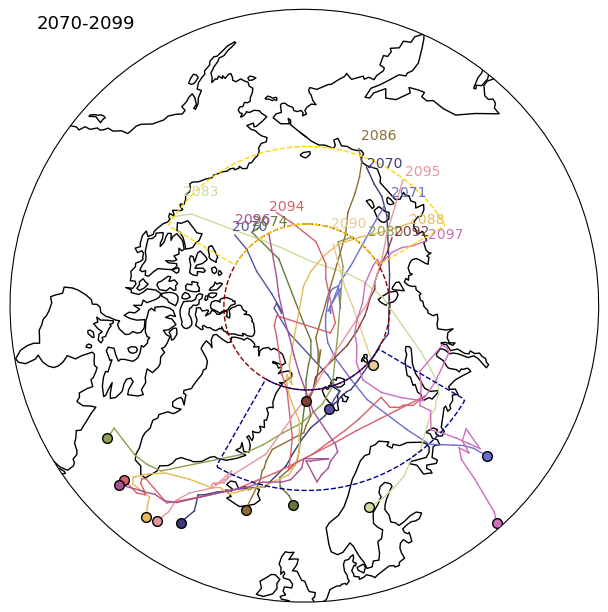

In [23]:
fig,ax=plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(7,7)) #    

objs_nr=len(objs_final_ssp)

for i in range(objs_nr):
    track = objs_final_ssp[i].track.values
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])  

    if isinstance(df_objs_ssp, pd.DataFrame):
        obj_id = objs_final_ssp[i]['id_'].item()
        obj_color = df_objs_ssp[df_objs_ssp['id'] == obj_id].color.item()
        
        # Only once per object
        ax.text(track_lons[-1], track_lats[-1],
                str(pd.to_datetime(objs_final_ssp[i].times[0].values).strftime('%Y')),
                fontsize=10, transform=crs_rot, color=obj_color, zorder=12)

        ax.scatter(track_lons[0], track_lats[0],
                   facecolor=obj_color, edgecolor='k',
                   transform=crs_rot, zorder=12)

        # Now draw the lines
        for j in range(0, len(track_lats) - 6, 6):
            lat_start = track_lats[j]
            lon_start = track_lons[j]
            lat_end = track_lats[j + 6]
            lon_end = track_lons[j + 6]
            ax.plot([lon_start, lon_end], [lat_start, lat_end],
                    color=obj_color, transform=crs_rot, linewidth=1)
ax.coastlines()
ax.set_extent([-180, 180, 55, 90], crs=ccrs.PlateCarree())
#ax.gridlines(linewidth=0.5, color='dimgray', alpha=0.4, zorder=2)

center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

for domain_name, domain_data in mask_domains.items():
    domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())


ax.set_title('2070-2099',loc='left')
plt.savefig('/work/aa0049/a271122/ICON_NorESM/tracks_eoc.png',dpi=300)

plt.show()


Text(0.0, 1.0, 'ICON+NorESM2-MM 2015-2099')

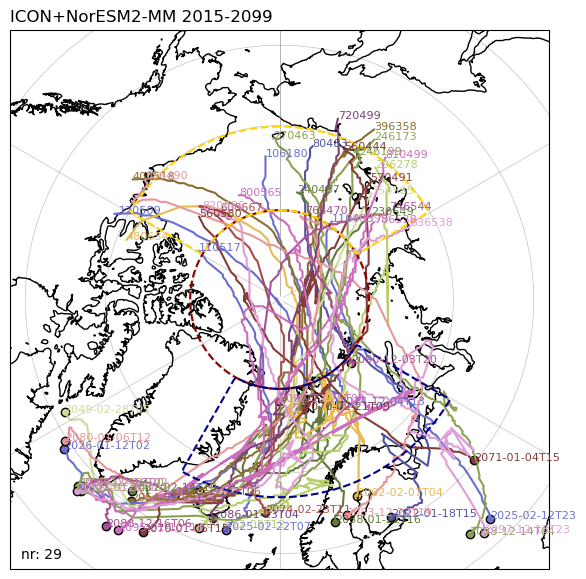

In [34]:
fig,ax=plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(7,7)) #    

objs_nr=len(objs_final_ssp)

for i in range(objs_nr):
    track=objs_final_ssp[i].track.values
    
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])  

    if isinstance(df_objs_ssp, pd.DataFrame):
        obj_id=objs_final_ssp[i]['id_'].item()
        obj_color=df_objs_ssp[df_objs_ssp['id'] == obj_id].color.item()
        ax.text(track_lons[-1],track_lats[-1],obj_id,fontsize=8,\
                transform=crs_rot,color=obj_color,zorder=11)
        ax.text(track_lons[0],track_lats[0],str(objs_final_ssp[i]['times'][0].values.astype('datetime64[h]')),fontsize=8,\
                transform=crs_rot,color=obj_color,zorder=11)
        ax.scatter(track_lons[0],track_lats[0],facecolor=obj_color,edgecolor='k',transform=crs_rot)
        ax.plot(track_lons,track_lats,color=obj_color,transform=crs_rot) 

ax.coastlines()
ax.set_extent([-180,180, 58, 90], crs=ccrs.PlateCarree())
ax.gridlines(linewidth=0.5,color='dimgray',alpha=0.4,zorder=2)

for domain_name, domain_data in mask_domains.items():
    domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1.5,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())

ax.text(0.02,0.02,f'nr: {objs_nr}',transform=ax.transAxes,\
       bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

ax.set_title('ICON+NorESM2-MM 2015-2099',loc='left')

# Plot Lifecycle Composites

### Functions

##### "Global variables"

In [86]:
#Geopotential height at 850 hPa
#Sea level pressure
var='psl'
varname = 'psl'
ds = xr.open_mfdataset(f'{ICON_NorESM_path}/{var}/v20250601/{var}_*.nc',chunks = {'time':10})
ds_clim = xr.open_dataset(f'{ICON_clim_path}/clim/{var}/{var}_clim_day_DJF.nc',chunks={'time': 10})

#Select dataset and climatology for different domain times
var_NA, var_CA, var_BS, var_clim_NA, var_clim_CA, var_clim_BS = get_domain_values(ds[varname],ds_clim,NA_combined_times, CA_combined_times, BS_combined_times)

#Compute anomalies
psl_NA_anom = var_NA - var_clim_NA[varname].mean(dim='time')
psl_CA_anom = var_CA - var_clim_CA[varname].mean(dim='time')
psl_BS_anom = var_BS - var_clim_BS[varname].mean(dim='time')

#Sea Ice edge
ds_ice = xr.open_dataset('/work/aa0049/a271122/ICON_NorESM/siconc_NorESM_remapped.nc',chunks = {'time':10})
ds_ice =ds_ice.sel(time=slice("2070-01-01","2099-12-31"))

siconc_mean= ds_ice.siconc.sel(time=ds_ice.siconc.time.dt.month.isin([12, 1, 2])).mean(dim='time') #Winter sea ice


sea_ice_edge = siconc_mean.where(((ds_land.FR_LAND+ds_lake.FR_LAKE)<0.85))


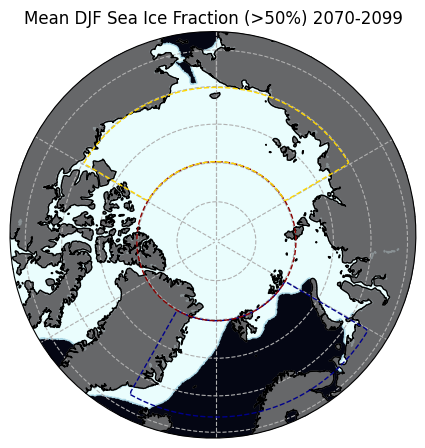

In [87]:
ds_ice_ssp = xr.open_mfdataset('/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/mon/siconca/v20250601/siconca_ARC-12_NorESM2-MM_ssp370_r1i1p1f1_CLMcom-AWI_ICON-CLM-202401-1-1_v1-r1_mon_*.nc',decode_times=False,chunks = {'time':10})
# Replace this if time is a coordinate
months_since_1950 = ds_ice_ssp['time'].values
ds_ice_ssp['time'] = pd.date_range(start='2015-01-01', periods=len(months_since_1950), freq='MS')


ds_ice_ssp =ds_ice_ssp.sel(time=slice("2070-01-01","2099-12-31"))

siconc_mean_ssp= ds_ice_ssp.siconca.sel(time=ds_ice_ssp.siconca.time.dt.month.isin([12, 1, 2])).mean(dim='time') #Winter sea ice


sea_ice_edge_ssp = siconc_mean_ssp.where(((ds_land.FR_LAND+ds_lake.FR_LAKE)<0.85))

# Define custom colormap (midnight blue for <1, white for 1)
#colors = ["midnightblue", "snow"]  # Define colors
#bounds = [0, 0.9999, 1]  # Boundaries for color mapping
#cmap = mcolors.ListedColormap(colors)  # Create colormap
#norm = mcolors.BoundaryNorm(bounds, cmap.N)  # Ensure correct mapping

cmap='cmo.ice'
fig, ax = plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)})#,figsize=(16,4))

variable =  (sea_ice_edge_ssp>50).plot(ax=ax,transform=crs_rot,cmap=cmap,vmin=0,vmax=1, add_colorbar = False)
   
# Add custom colorbar
#colorbar = plt.colorbar(variable, ax=ax, orientation='vertical', pad=0.06, shrink=0.8)
#colorbar.set_label('', fontsize=10)
#colorbar.ax.tick_params(labelsize=10)


#Add sea ice
contour = (sea_ice_edge_ssp>50).plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'lightblue', linewidths = 1, linestyles = '-',zorder=1)
#ax.clabel(contour, fmt='%1.0f', inline=True, fontsize=10)

#Add domain mask
for domain in domains: 
    mask_domains[domain]["mask"].plot.contour(levels=1,colors=mask_domains[domain]["color"],\
        linewidths=1,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())
ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)
ax.add_feature(cartopy.feature.LAND, color='gray',alpha=0.8,zorder=1, edgecolor='black') 
#ax.add_feature(cartopy.feature.OCEAN, color='midnightblue',zorder=0, edgecolor='None')

ax.set_aspect('equal')
center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.set_title("Mean DJF Sea Ice Fraction (>50%) 2070-2099",y=1.05)

plt.savefig('sic_70-99_NorESM.png')
plt.show()

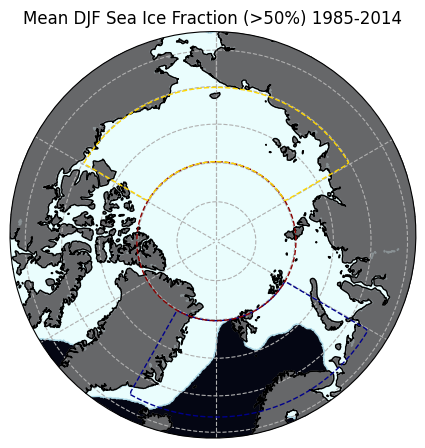

In [23]:
ds_ice = xr.open_mfdataset('/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/historical/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/mon/siconca/v20250601/siconca_ARC-12_NorESM2-MM_historical_r1i1p1f1_CLMcom-AWI_ICON-CLM-202401-1-1_v1-r1_mon_*.nc',chunks = {'time':10})
ds_ice =ds_ice.sel(time=slice("1985-01-01","2014-12-31"))

siconc_mean= ds_ice.siconca.sel(time=ds_ice.siconca.time.dt.month.isin([12, 1, 2])).mean(dim='time') #Winter sea ice
sea_ice_edge = siconc_mean.where(((ds_land.FR_LAND+ds_lake.FR_LAKE)<0.85))

# Define custom colormap (midnight blue for <1, white for 1)
#colors = ["midnightblue", "snow"]  # Define colors
#bounds = [0, 0.9999, 1]  # Boundaries for color mapping
#cmap = mcolors.ListedColormap(colors)  # Create colormap
#norm = mcolors.BoundaryNorm(bounds, cmap.N)  # Ensure correct mapping

cmap='cmo.ice'
fig, ax = plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)})#,figsize=(16,4))

variable =  (sea_ice_edge>50).plot(ax=ax,transform=crs_rot,cmap=cmap,vmin=0,vmax=1, add_colorbar = False)
   
# Add custom colorbar
#colorbar = plt.colorbar(variable, ax=ax, orientation='vertical', pad=0.06, shrink=0.8)
#colorbar.set_label('', fontsize=10)
#colorbar.ax.tick_params(labelsize=10)


#Add sea ice
contour = (sea_ice_edge>50).plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'lightblue', linewidths = 1, linestyles = '-',zorder=1)
#ax.clabel(contour, fmt='%1.0f', inline=True, fontsize=10)

#Add domain mask
for domain in domains: 
    mask_domains[domain]["mask"].plot.contour(levels=1,colors=mask_domains[domain]["color"],\
        linewidths=1,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())
ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)
ax.add_feature(cartopy.feature.LAND, color='gray',alpha=0.8,zorder=1, edgecolor='black') 
#ax.add_feature(cartopy.feature.OCEAN, color='midnightblue',zorder=0, edgecolor='None')

ax.set_aspect('equal')
center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.set_title("Mean DJF Sea Ice Fraction (>50%) 1985-2014",y=1.05)

plt.savefig('sic_85-14_NorESM.png')
plt.show()


In [27]:
sic_change = siconc_mean_ssp - siconc_mean
sea_ice_edge_change = sic_change.where(((ds_land.FR_LAND+ds_lake.FR_LAKE)<0.85))

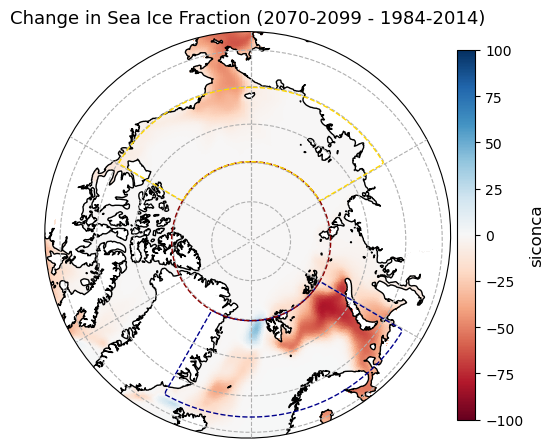

In [28]:
# Define custom colormap (midnight blue for <1, white for 1)
#colors = ["midnightblue", "snow"]  # Define colors
#bounds = [0, 0.9999, 1]  # Boundaries for color mapping
#cmap = mcolors.ListedColormap(colors)  # Create colormap
#norm = mcolors.BoundaryNorm(bounds, cmap.N)  # Ensure correct mapping

cmap='RdBu'
fig, ax = plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)})#,figsize=(16,4))

variable =  sea_ice_edge_change.plot(ax=ax,transform=crs_rot,cmap=cmap,vmin=-100,vmax=100)
   
# Add custom colorbar
#colorbar = plt.colorbar(variable, ax=ax, orientation='vertical', pad=0.06, shrink=0.8)
#colorbar.set_label('', fontsize=10)
#colorbar.ax.tick_params(labelsize=10)


#Add sea ice
#contour = sic_change.plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'lightblue', linewidths = 1, linestyles = '-',zorder=1)

#Add domain mask
for domain in domains: 
    mask_domains[domain]["mask"].plot.contour(levels=1,colors=mask_domains[domain]["color"],\
        linewidths=1,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())

ax.set_aspect('equal')
center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)

ax.set_title("Change in Sea Ice Fraction (2070-2099 - 1984-2014)",y=1.05)

plt.savefig('sic_change_CNRM.png')
plt.show()



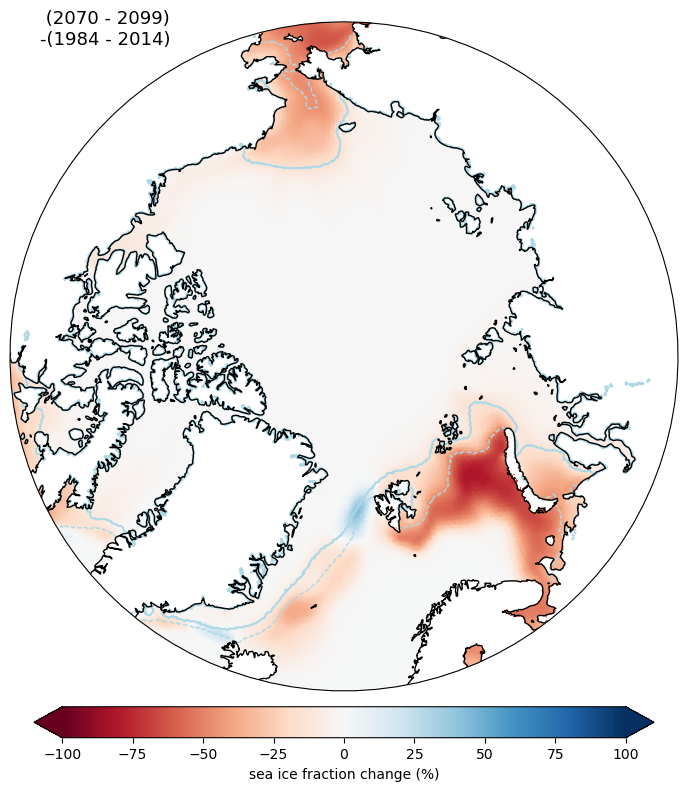

In [29]:
# Define custom colormap (midnight blue for <1, white for 1)
#colors = ["midnightblue", "snow"]  # Define colors
#bounds = [0, 0.9999, 1]  # Boundaries for color mapping
#cmap = mcolors.ListedColormap(colors)  # Create colormap
#norm = mcolors.BoundaryNorm(bounds, cmap.N)  # Ensure correct mapping

cmap='RdBu'
fig, ax = plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(10,10))

variable =  sea_ice_edge_change.plot(ax=ax,transform=crs_rot,cmap=cmap,vmin=-100,vmax=100,add_colorbar=False)
   
# Add custom colorbar
colorbar = plt.colorbar(variable, ax=ax, orientation='horizontal', pad=0.06, shrink=0.8,extend='both')
colorbar.set_label('sea ice fraction change (%)', fontsize=10)
colorbar.ax.tick_params(labelsize=10)


#Add sea ice
contour = (sea_ice_edge_ssp>50).plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'lightblue', linewidths = 1, linestyles = '--',zorder=1)
contour = (sea_ice_edge_ssp>85).plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'lightblue', linewidths = 1.5, linestyles = '-',zorder=1)

#Add domain mask
#for domain in domains: 
#    mask_domains[domain]["mask"].plot.contour(levels=1,colors=mask_domains[domain]["color"],\
#        linewidths=1,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())

ax.set_aspect('equal')
center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
#ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)

ax.set_title(" (2070 - 2099) \n-(1984 - 2014)",loc='left')

plt.savefig('/work/aa0049/a271122/ICON_NorESM/sic_change_NorESM.png')
plt.show()



#### tas (T_2M)

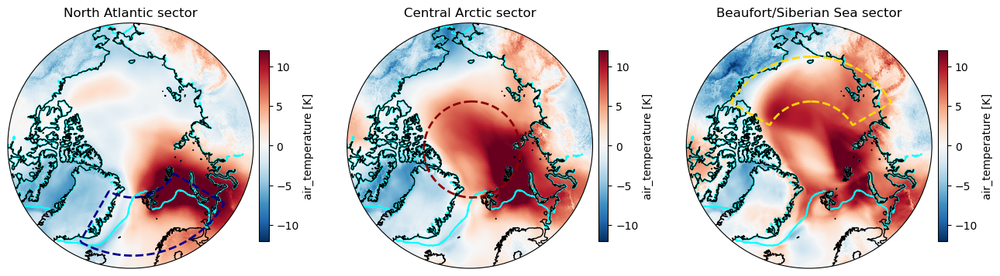

In [25]:
create_composites('tas','tas',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -12,12,
                  NESM=True)

#### pr 

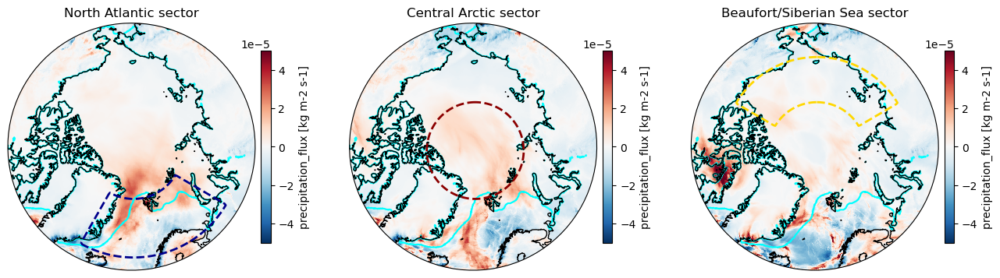

In [26]:
create_composites('pr','pr',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -0.00005,0.00005,
                  NESM=True)

#### rlds (ATHD_S)

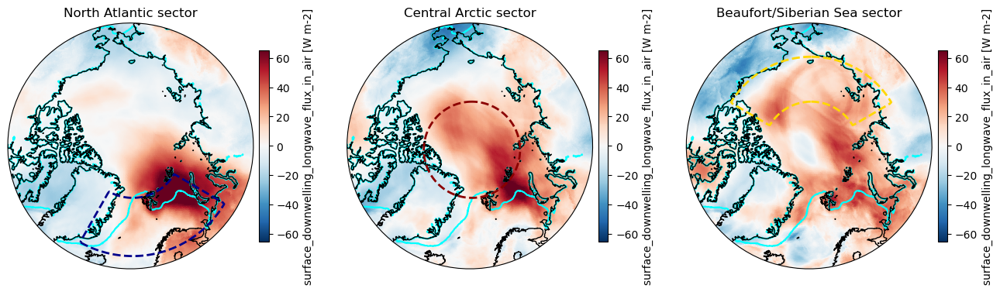

In [27]:
create_composites('rlds','rlds',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -65,65,
                  NESM=True)

#### hfls (ALHFL_S)

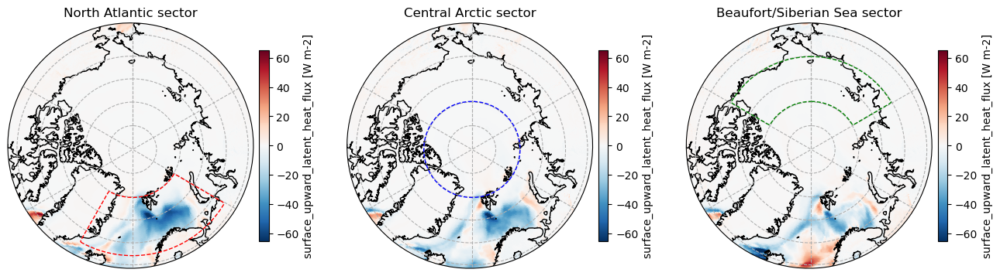

In [26]:
create_composites('hfls','hfls',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -65,65,
                  NESM=True)

#### hfss (ASHFL_S)

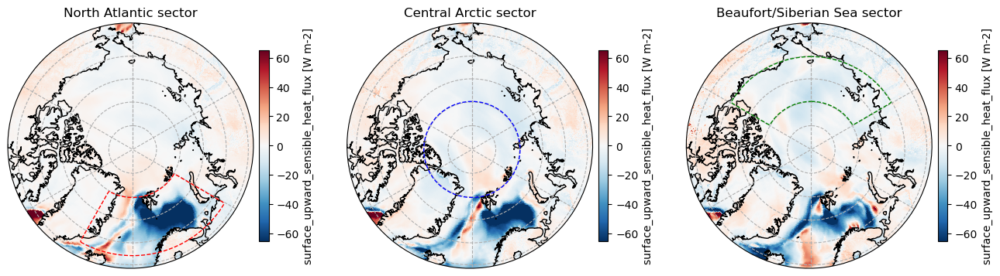

In [27]:
create_composites('hfss','hfss',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -65,65,
                  NESM=True)

#### psl (PMSL)

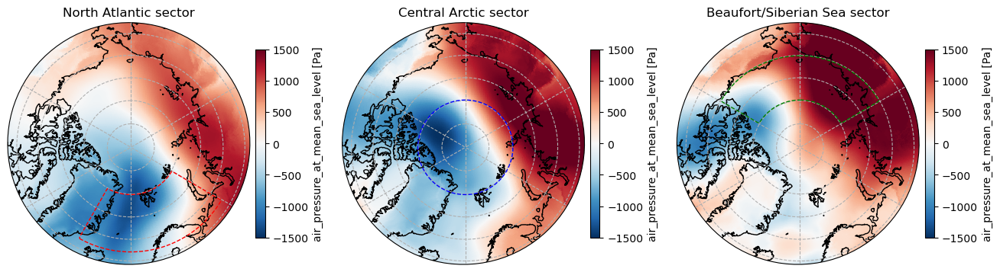

In [27]:
create_composites('psl','psl',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -1500,1500,
                  NESM=True)

#### hurs (RELHUM_2M)

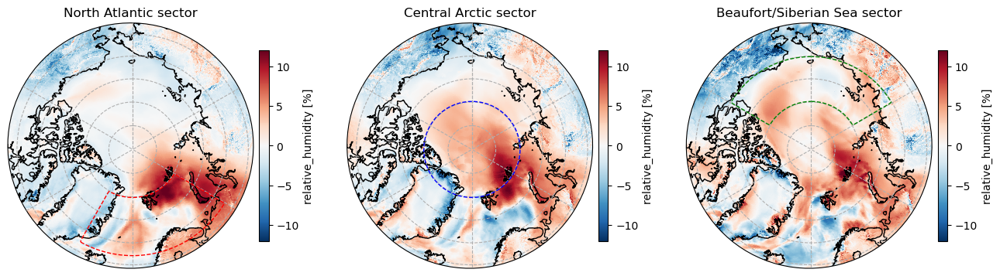

In [28]:
create_composites('hurs','hurs',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -12,12,
                  NESM=True)

#### prw (TQV)

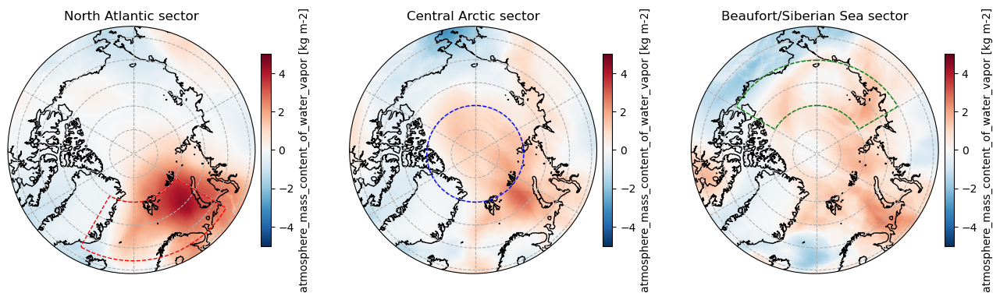

In [37]:
create_composites('prw','prw',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -5,5,
                  NESM=True)

#### sfcWind

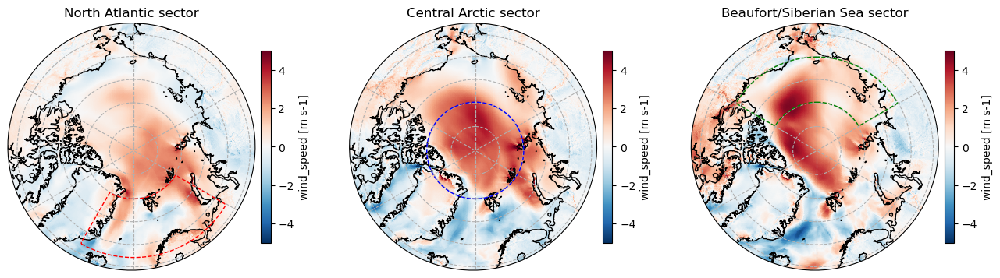

In [32]:
create_composites('sfcWind','sfcWind',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -5,5,
                  NESM=True)

#### clivi

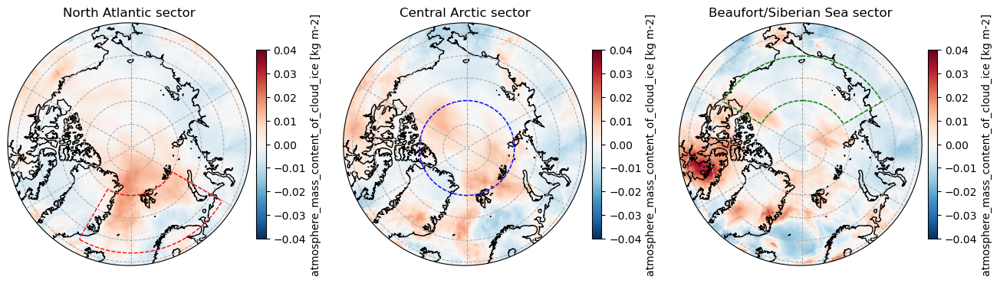

In [30]:
create_composites('clivi','clivi',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -0.04,0.04,
                  NESM=True)

#### clwvi

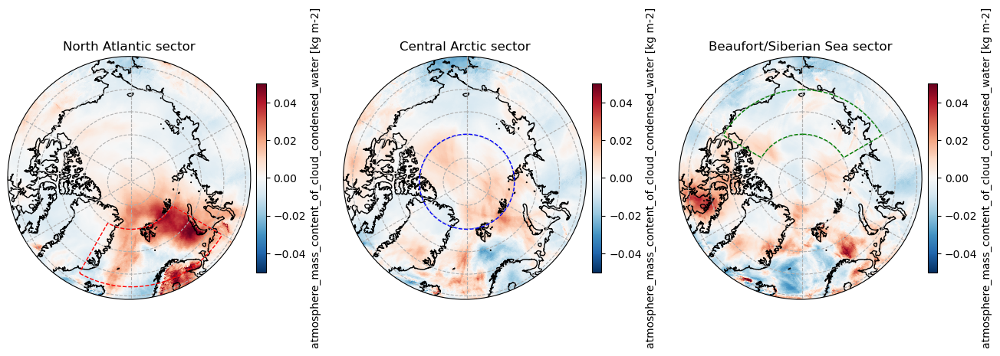

In [31]:
create_composites('clwvi','clwvi',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -0.05,0.05,
                  NESM=True)

### Lifecycle MOAAP Objects

#### Functions

In [18]:
#Open moaap objects 
ds_moaap = xr.open_mfdataset('/work/aa0238/a271093/results/MOAAP/IVT_Tracking/NorESM_control_remapped_3x/ObjectMasks_MOAPP_ICON_100and85controlperc_remapped_3x_*_corrected.nc',chunks={'time': 10})

lat_tmp=ds_moaap.rlat.isel(x=0).values[0] #time=0,
lon_tmp=ds_moaap.rlon.isel(y=0).values[0] #time=0,

ds_moaap=ds_moaap.drop(['rlat','rlon']).rename_dims({'y':'rlat','x':'rlon'}).assign_coords(rlat=lat_tmp,rlon=lon_tmp)
                   

In [31]:
ds_moaap_DJF = ds_moaap.where(ds_moaap['time'].dt.month.isin([12, 1, 2]), drop=True)

In [32]:

# Make sure flat_times is a NumPy datetime64 array
all_times_np = np.array(objs_all_times, dtype='datetime64[ns]')

# Select only matching times
ds_moaap_DJF_filtered = ds_moaap_DJF.sel(time=ds_moaap_DJF.time[np.isin(ds_moaap_DJF.time.values, all_times_np)])


In [33]:
list_ids = [objs_final[i]['id_'].item() for i in range(len(objs_final))]
list_ids_int = np.array(list_ids, dtype=int)

In [34]:
ivt_objects = ds_moaap_DJF_filtered.IVT_Objects.values.astype(int)  # convert to int
mask = np.isin(ivt_objects, list_ids_int)  # True where IVT_Object is in list_ids_int

TA_WAIs_his = mask.sum(axis=0)  # shape: [lat, lon]


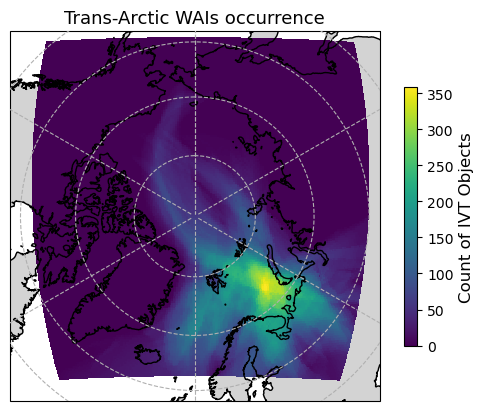

In [31]:


fig, ax = plt.subplots(1, 1,subplot_kw={'projection': ccrs.Orthographic(0,90)})

lats = ds_moaap_DJF_filtered.rlat
lons = ds_moaap_DJF_filtered.rlon

count = ax.pcolormesh(lons, lats, TA_WAIs_his, cmap='viridis',transform=crs_rot)#,cbar_kwargs={'extend':'neither','pad':0.01})

# Add the colorbar
cbar = fig.colorbar(count, ax=ax, orientation='vertical', shrink=0.7, pad=0.05)
cbar.set_label('Count of IVT Objects')


ax.set_extent([-180, 180, 58, 90], crs=ccrs.PlateCarree())
ax.set_title('Trans-Arctic WAIs occurrence')
ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)
ax.add_feature(cartopy.feature.LAND, color='lightgray',zorder=0, edgecolor='None') 
plt.show()

In [17]:
### SSP
#Open moaap objects 
ds_moaap_ssp = xr.open_mfdataset('/work/aa0238/a271093/results/MOAAP/IVT_Tracking/NorESM_ssp_remapped_3x/ObjectMasks_MOAPP_ICON_100and85NorESMsspperc_remapped_3x_*_corrected.nc',chunks={'time': 10})

lat_tmp=ds_moaap_ssp.rlat.isel(x=0).values[0] #time=0,l
lon_tmp=ds_moaap_ssp.rlon.isel(y=0).values[0] #time=0,

ds_moaap_ssp=ds_moaap_ssp.drop(['rlat','rlon']).rename_dims({'y':'rlat','x':'rlon'}).assign_coords(rlat=lat_tmp,rlon=lon_tmp)
                   

In [17]:
ds_moaap_DJF_ssp = ds_moaap_ssp.where(ds_moaap_ssp['time'].dt.month.isin([12, 1, 2]), drop=True)

In [37]:

# Make sure flat_times is a NumPy datetime64 array
all_times_np_ssp = np.array(objs_all_times_ssp, dtype='datetime64[ns]')

# Select only matching times
ds_moaap_DJF_filtered_ssp = ds_moaap_DJF_ssp.sel(time=ds_moaap_DJF_ssp.time[np.isin(ds_moaap_DJF_ssp.time.values, all_times_np_ssp)])


In [68]:
np.unique(ds_moaap_DJF_filtered_ssp.IVT_Objects.isel(rlon=100,rlat=100).values) #.plot()


array([     0., 106180., 120509., 230649., 230655., 246173., 246199.,
       396358., 400518., 480634., 560444., 570488., 570491., 570498.,
       600667., 720499., 746544., 800565., 800599., 836530.],
      dtype=float32)

In [38]:
list_ids_ssp = [objs_final_ssp[i]['id_'].item() for i in range(len(objs_final_ssp))]
list_ids_int_ssp = np.array(list_ids_ssp, dtype=int)

In [39]:
ivt_objects_ssp = ds_moaap_DJF_filtered_ssp.IVT_Objects.values.astype(int)  # convert to int
mask_ssp = np.isin(ivt_objects_ssp, list_ids_int_ssp)  # True where IVT_Object is in list_ids_int


In [40]:

TA_WAIs_SSP = mask_ssp.sum(axis=0)  # shape: [lat, lon]


In [ ]:
fig, ax = plt.subplots(1, 1,subplot_kw={'projection': ccrs.Orthographic(0,90)})

lats = ds_moaap_DJF_filtered.rlat
lons = ds_moaap_DJF_filtered.rlon

count = ax.pcolormesh(lons, lats, TA_WAIs_SSP, cmap='viridis',transform=crs_rot)#,cbar_kwargs={'extend':'neither','pad':0.01})

# Add the colorbar
cbar = fig.colorbar(count, ax=ax, orientation='vertical', shrink=0.7, pad=0.05)
cbar.set_label('Count of IVT Objects')


ax.set_extent([-180, 180, 58, 90], crs=ccrs.PlateCarree())
ax.set_title('Trans-Arctic WAIs Occurrence')
ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)
ax.add_feature(cartopy.feature.LAND, color='lightgray',zorder=0, edgecolor='None') 
plt.show()

In [41]:
TA_occurrence_change = TA_WAIs_SSP - TA_WAIs_his

In [ ]:

fig, ax = plt.subplots(1, 1,subplot_kw={'projection': ccrs.Orthographic(0,90)})

lats = ds_moaap_DJF_filtered.rlat
lons = ds_moaap_DJF_filtered.rlon

count = ax.pcolormesh(lons, lats, TA_occurrence_change, cmap='RdBu_r',transform=crs_rot)#,cbar_kwargs={'extend':'neither','pad':0.01})

# Add the colorbar
cbar = fig.colorbar(count, ax=ax, orientation='vertical', shrink=0.7, pad=0.05)
cbar.set_label('Count of IVT Objects')


ax.set_extent([-180, 180, 58, 90], crs=ccrs.PlateCarree())
ax.set_title('Change in Trans-Arctic WAIs Occurrence')
ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)
ax.add_feature(cartopy.feature.LAND, color='lightgray',zorder=0, edgecolor='None') 
plt.show()



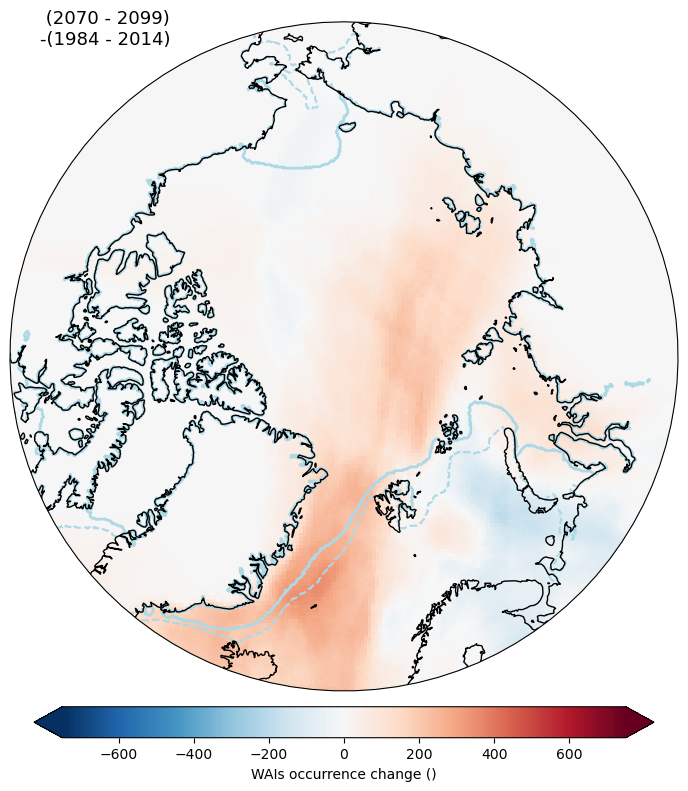

In [64]:

cmap = 'RdBu_r'
fig, ax = plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(10,10))

lats = ds_moaap_DJF_filtered.rlat
lons = ds_moaap_DJF_filtered.rlon
count = ax.pcolormesh(lons, lats, TA_occurrence_change, cmap=cmap,transform=crs_rot,vmin=-750,vmax=750)#,cbar_kwargs={'extend':'neither','pad':0.01})
  
# Add custom colorbar
colorbar = plt.colorbar(count, ax=ax, orientation='horizontal', pad=0.06, shrink=0.8,extend='both')
colorbar.set_label('WAIs occurrence change ()', fontsize=10)
colorbar.ax.tick_params(labelsize=10)


#Add sea ice
contour = (sea_ice_edge_ssp>50).plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'lightblue', linewidths = 1.5, linestyles = '--',zorder=1)
contour = (sea_ice_edge_ssp>85).plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'lightblue', linewidths = 2, linestyles = '-',zorder=1)

#Add domain mask
#for domain in domains: 
#    mask_domains[domain]["mask"].plot.contour(levels=1,colors=mask_domains[domain]["color"],\
#        linewidths=1,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())

ax.set_aspect('equal')
center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
#ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)

ax.add_feature(cartopy.feature.LAND, color='lightgray',zorder=0, edgecolor='None') 

ax.set_title(" (2070 - 2099) \n-(1984 - 2014)",loc='left')

plt.savefig('/work/aa0049/a271122/ICON_NorESM/occurrence_change_NorESM.png')
plt.show()



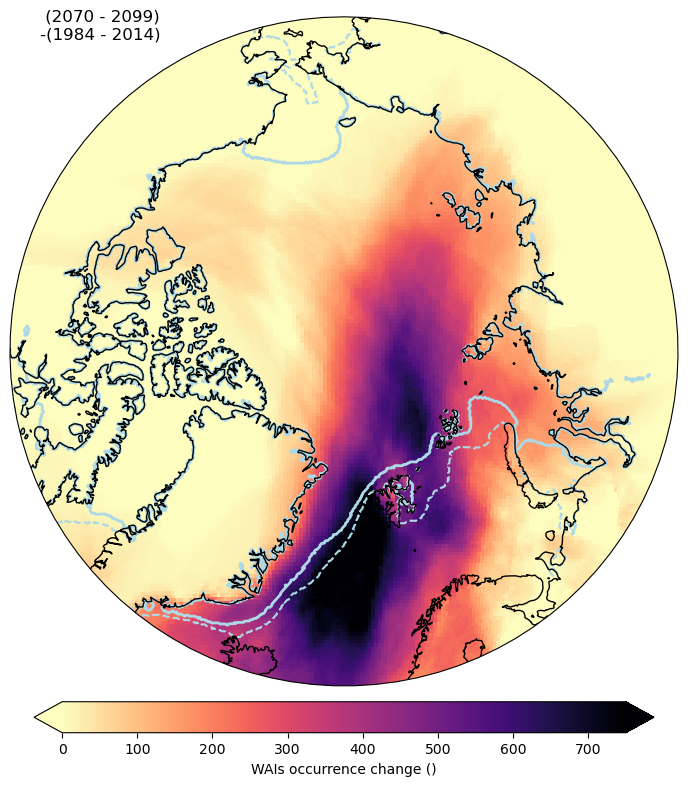

In [44]:

cmap='magma_r'
fig, ax = plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(10,10))

lats = ds_moaap_DJF_filtered.rlat
lons = ds_moaap_DJF_filtered.rlon
count = ax.pcolormesh(lons, lats, TA_occurrence_change, cmap=cmap,transform=crs_rot,vmin=0,vmax=750)#,cbar_kwargs={'extend':'neither','pad':0.01})
  
# Add custom colorbar
colorbar = plt.colorbar(count, ax=ax, orientation='horizontal', pad=0.06, shrink=0.8,extend='both')
colorbar.set_label('WAIs occurrence change ()', fontsize=10)
colorbar.ax.tick_params(labelsize=10)


#Add sea ice
contour = (sea_ice_edge_ssp>50).plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'lightblue', linewidths = 1.5, linestyles = '--',zorder=1)
contour = (sea_ice_edge_ssp>85).plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'lightblue', linewidths = 2, linestyles = '-',zorder=1)

#Add domain mask
#for domain in domains: 
#    mask_domains[domain]["mask"].plot.contour(levels=1,colors=mask_domains[domain]["color"],\
#        linewidths=1,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())

ax.set_aspect('equal')
center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
#ax.gridlines(linestyle='--',zorder=3)
ax.coastlines(zorder=2)

ax.add_feature(cartopy.feature.LAND, color='lightgray',zorder=0, edgecolor='None') 

ax.set_title(" (2070 - 2099) \n-(1984 - 2014)",loc='left')

plt.savefig('/work/aa0049/a271122/ICON_NorESM/occurrence_change_NorESM.png')
plt.show()



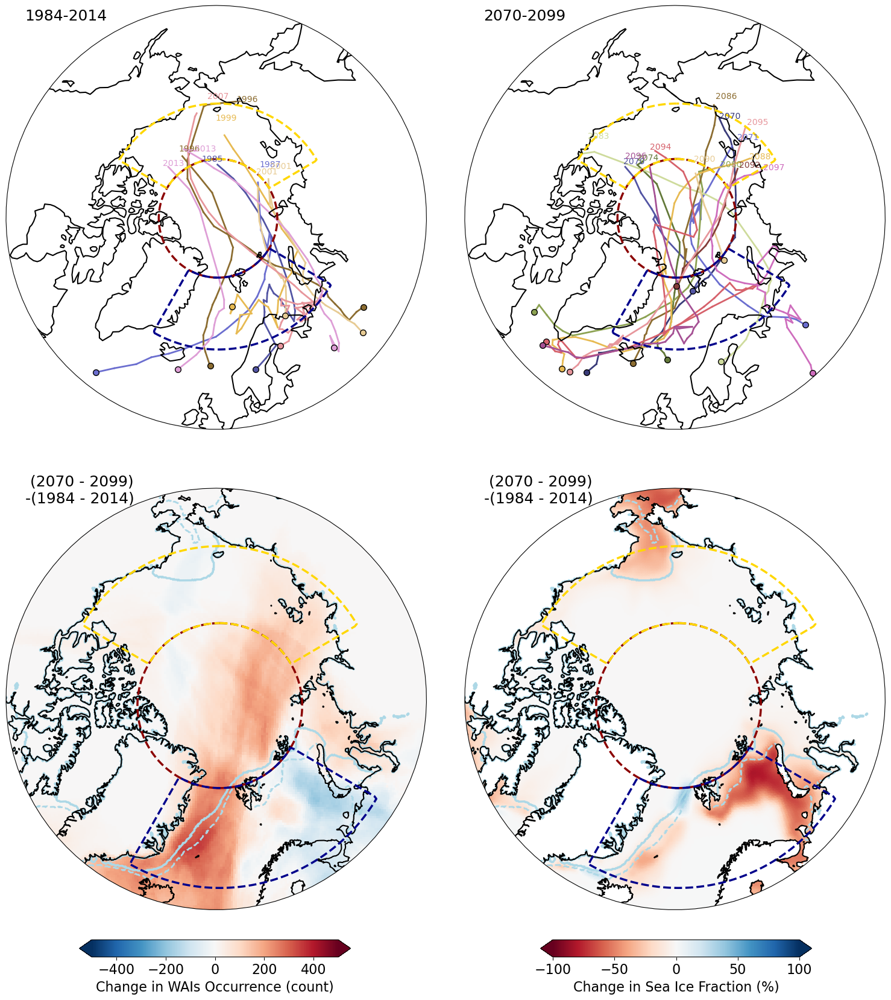

In [67]:
fig, axs = plt.subplots(2, 2,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(18,19))
ax = axs.flatten()

#############Figure A####################
for i in range(len(objs_final)):
    track = objs_final[i].track.values
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])  

    if isinstance(df_objs, pd.DataFrame):
        obj_id = objs_final[i]['id_'].item()
        obj_color = df_objs[df_objs['id'] == obj_id].color.item()
        
        # Only once per object
        ax[0].text(track_lons[-1], track_lats[-1],
                str(pd.to_datetime(objs_final[i].times[0].values).strftime('%Y')),
                fontsize=10, transform=crs_rot, color=obj_color, zorder=12)

        ax[0].scatter(track_lons[0], track_lats[0],
                   facecolor=obj_color, edgecolor='k',
                   transform=crs_rot, zorder=12)

        # Now draw the lines
        for j in range(0, len(track_lats) - 6, 6):
            lat_start = track_lats[j]
            lon_start = track_lons[j]
            lat_end = track_lats[j + 6]
            lon_end = track_lons[j + 6]
            ax[0].plot([lon_start, lon_end], [lat_start, lat_end],
                    color=obj_color, transform=crs_rot, linewidth=2)

ax[0].set_extent([-180, 180, 55, 90], crs=ccrs.PlateCarree())

center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax[0].set_boundary(circle, transform=ax[0].transAxes)
#############Figure B####################

for i in range(len(objs_final_ssp)):
    track = objs_final_ssp[i].track.values
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])  

    if isinstance(df_objs_ssp, pd.DataFrame):
        obj_id = objs_final_ssp[i]['id_'].item()
        obj_color = df_objs_ssp[df_objs_ssp['id'] == obj_id].color.item()
        
        # Only once per object
        ax[1].text(track_lons[-1], track_lats[-1],
                str(pd.to_datetime(objs_final_ssp[i].times[0].values).strftime('%Y')),
                fontsize=10, transform=crs_rot, color=obj_color, zorder=12)

        ax[1].scatter(track_lons[0], track_lats[0],
                   facecolor=obj_color, edgecolor='k',
                   transform=crs_rot, zorder=12)

        # Now draw the lines
        for j in range(0, len(track_lats) - 6, 6):
            lat_start = track_lats[j]
            lon_start = track_lons[j]
            lat_end = track_lats[j + 6]
            lon_end = track_lons[j + 6]
            ax[1].plot([lon_start, lon_end], [lat_start, lat_end],
                    color=obj_color, transform=crs_rot, linewidth=2)


ax[1].set_extent([-180, 180, 55, 90], crs=ccrs.PlateCarree())

center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax[1].set_boundary(circle, transform=ax[1].transAxes)
################Figure C#########################################

lats = ds_moaap_DJF_filtered.rlat
lons = ds_moaap_DJF_filtered.rlon
count = ax[2].pcolormesh(lons, lats, TA_occurrence_change, cmap='RdBu_r',
                         transform=crs_rot, vmin=-500, vmax=500)

# Create a colorbar axis manually below ax[2]
cax = fig.add_axes([0.175, 0.06, 0.25, 0.015])  # [left, bottom, width, height]
colorbar = plt.colorbar(count, cax=cax, orientation='horizontal',extend='both')
colorbar.set_label('Change in WAIs Occurrence (count)', fontsize=16)
colorbar.ax.tick_params(labelsize=16)

#Add sea ice
contour = (sea_ice_edge_ssp>50).plot.contour(levels=1, ax = ax[2], transform = crs_rot, colors = 'lightblue', linewidths = 2, linestyles = '--',zorder=1)
contour = (sea_ice_edge_ssp>85).plot.contour(levels=1, ax = ax[2], transform = crs_rot, colors = 'lightblue', linewidths = 2.5, linestyles = '-',zorder=1)


ax[2].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())

center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax[2].set_boundary(circle, transform=ax[2].transAxes)

##############Figure D###########################################

variable = sea_ice_edge_change.plot(ax=ax[3], transform=crs_rot,
                                    cmap='RdBu', vmin=-100, vmax=100,
                                    add_colorbar=False)

cax = fig.add_axes([0.6, 0.06, 0.25, 0.015])  # Adjust placement
colorbar = plt.colorbar(variable, cax=cax, orientation='horizontal',extend='both')
colorbar.set_label('Change in Sea Ice Fraction (%)', fontsize=16)
colorbar.ax.tick_params(labelsize=16)


#Add sea ice
contour = (sea_ice_edge_ssp>50).plot.contour(levels=1, ax = ax[3], transform = crs_rot, colors = 'lightblue', linewidths = 2, linestyles = '--',zorder=1)
contour = (sea_ice_edge_ssp>85).plot.contour(levels=1, ax = ax[3], transform = crs_rot, colors = 'lightblue', linewidths = 2.5, linestyles = '-',zorder=1)

ax[3].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())

center, radius = [0.5, 0.5], 0.55
circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                               np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
ax[3].set_boundary(circle, transform=ax[3].transAxes)


for axes in ax: 

    for domain_name, domain_data in mask_domains.items():
        domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=2.5,linestyles='--',zorder=4,ax=axes,transform=ccrs.PlateCarree())


    axes.coastlines(zorder=3,linewidth=1.5)
    axes.add_feature(cartopy.feature.LAND, color='white',zorder=0, edgecolor='None') 


ax[0].set_title("1984-2014",loc='left',fontsize=18.)
ax[1].set_title("2070-2099",loc='left',fontsize=18.)
ax[2].set_title(" (2070 - 2099) \n-(1984 - 2014)",loc='left',fontsize=18.)
ax[3].set_title(" (2070 - 2099) \n-(1984 - 2014)",loc='left',fontsize=18.)


#plt.tight_layout()
plt.savefig('/work/aa0049/a271122/ICON_NorESM/Intro_NorESM.png',dpi=300,bbox_inches='tight')
plt.show()



In [20]:
list_ids = [objs_final[i]['id_'].item() for i in range(len(objs_final))]

#### tas (T_2M)

In [24]:
ds_moaap.IVT_Objects[0]

<xarray.DataArray 'IVT_Objects' (rlat: 194, rlon: 193)>
dask.array<getitem, shape=(194, 193), dtype=float32, chunksize=(194, 193), chunktype=numpy.ndarray>
Coordinates:
    time     datetime64[ns] 1984-01-01T01:00:00
  * rlat     (rlat) float32 -24.2 -23.9 -23.6 -23.3 ... 32.8 33.1 33.4 33.7
  * rlon     (rlon) float32 -29.9 -29.6 -29.3 -29.0 ... 26.8 27.1 27.4 27.7
Attributes:
    longname:  IVT objects
    unit:

In [17]:
tas_shape_list, tas_clim_list, tas_anomaly_list = create_and_store_lists('tas','tas','',
                                                                        domains,ICON_NorESM_path,ICON_clim_path,
                                                                        objs_final,ds_moaap,NESM=True)

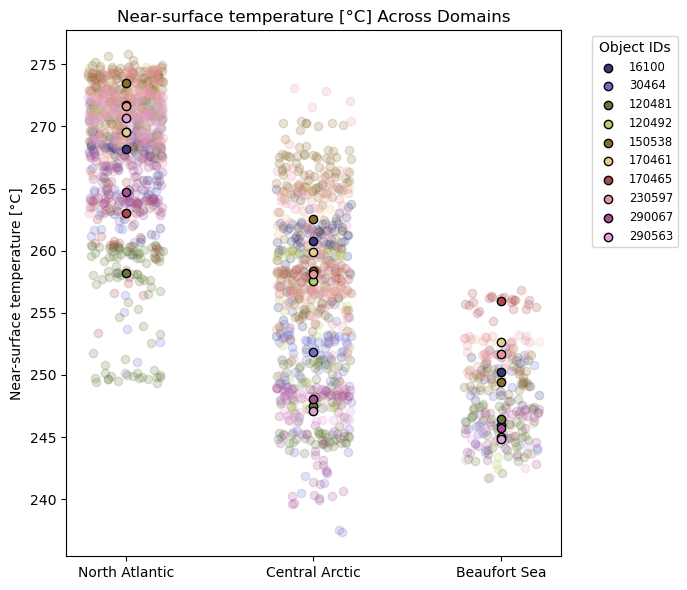

In [21]:
plot_scatter_domains(tas_shape_list[0], tas_shape_list[1], tas_shape_list[2], list_ids, f'Near-surface temperature [°C]',f'Near-surface temperature [°C] Across Domains', savefig = False)

In [47]:
tas_shape_list, tas_clim_list, tas_anomaly_list = create_and_store_lists('tas','tas','',
                                                                        domains,ICON_NorESM_path,ICON_clim_path,
                                                                        objs_final,ds_moaap,NESM=True)

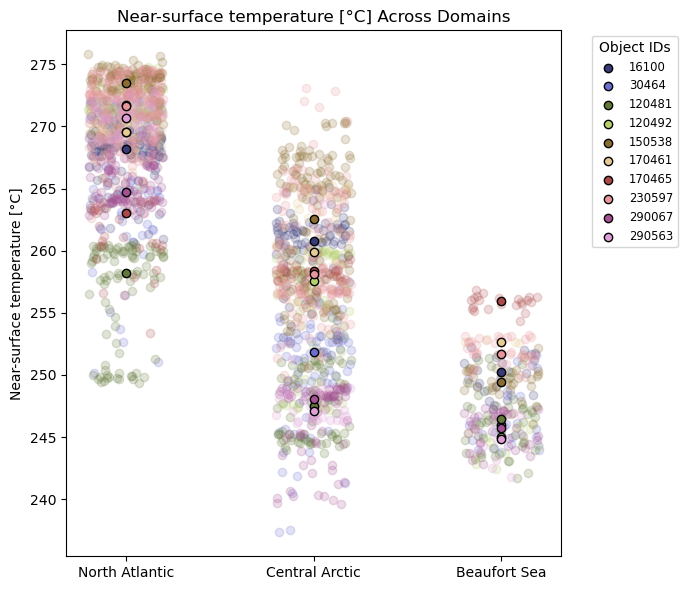

In [38]:
plot_scatter_domains(tas_shape_list[0], tas_shape_list[1], tas_shape_list[2], list_ids, f'Near-surface temperature [°C]',f'Near-surface temperature [°C] Across Domains', savefig = False)

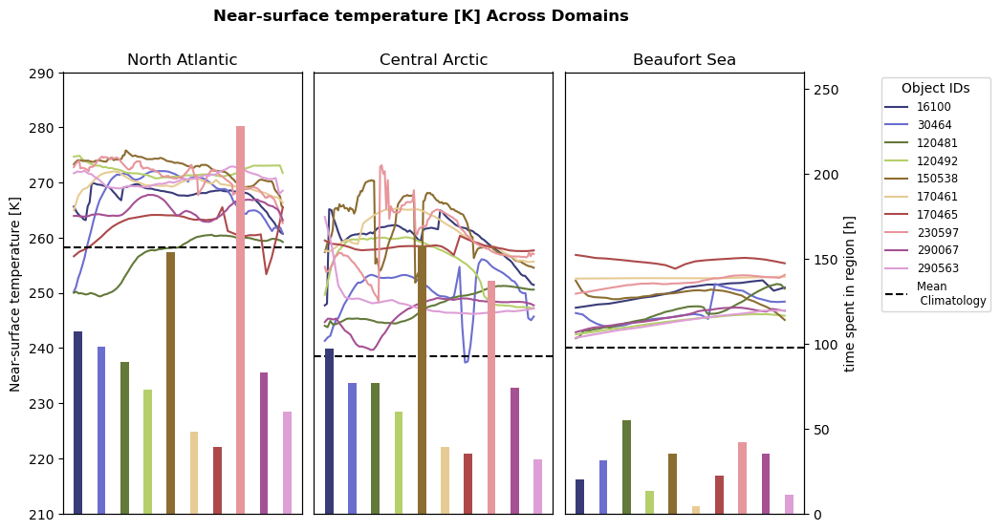

In [78]:
plot_masked_shapes_clim(tas_shape_list[0], tas_shape_list[1], tas_shape_list[2],
                                   tas_clim_list[0]['tas'].mean(dim=("rlat","rlon")),tas_clim_list[1]['tas'].mean(dim=("rlat","rlon")),tas_clim_list[2]['tas'].mean(dim=("rlat","rlon")),
                                   list_ids, f'Near-surface temperature [K]', f'Near-surface temperature [K] Across Domains',vmin=210,vmax=290, savefig = False,clim=True,bars=True)

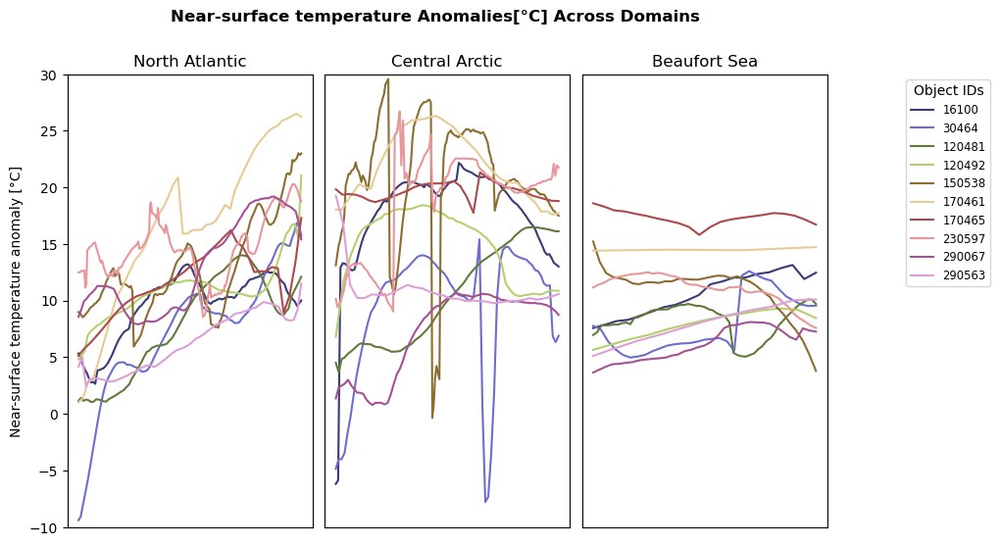

In [41]:
plot_masked_shapes_clim(tas_anomaly_list[0], tas_anomaly_list[1], tas_anomaly_list[2],
                                   tas_clim_list[0]['tas'].mean(dim=("rlat","rlon"))-273.15,tas_clim_list[1]['tas'].mean(dim=("rlat","rlon"))-273.15,tas_clim_list[2]['tas'].mean(dim=("rlat","rlon"))-273.15,
                                   list_ids,f'Near-surface temperature anomaly [°C]', f'Near-surface temperature Anomalies[°C] Across Domains',vmin=-10,vmax=30,bars=False)

#### prw (TQV)

In [33]:
prw_shape_list, prw_clim_list, prw_anomaly_list = create_and_store_lists('prw','prw','',
                                                                        domains,ICON_NorESM_path,ICON_clim_path,
                                                                        objs_final,ds_moaap,NESM=True)

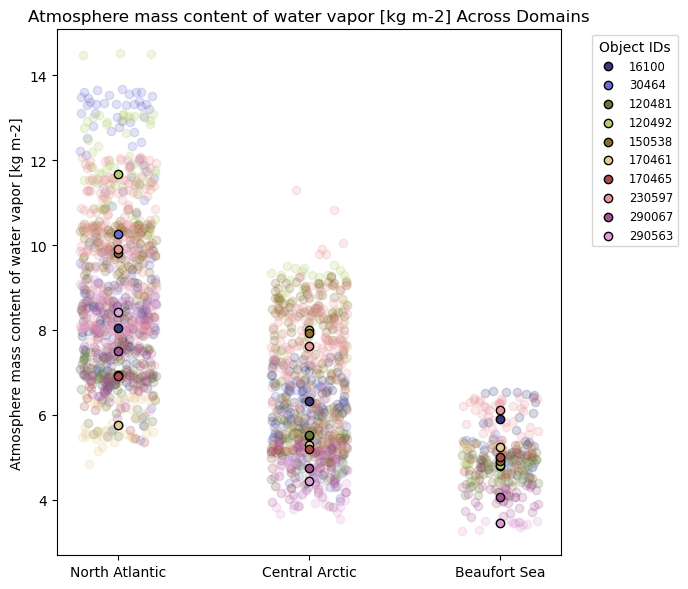

In [80]:
plot_scatter_domains(prw_shape_list[0], prw_shape_list[1], prw_shape_list[2], list_ids, f'Atmosphere mass content of water vapor [kg m-2]',f'Atmosphere mass content of water vapor [kg m-2] Across Domains', savefig = False)

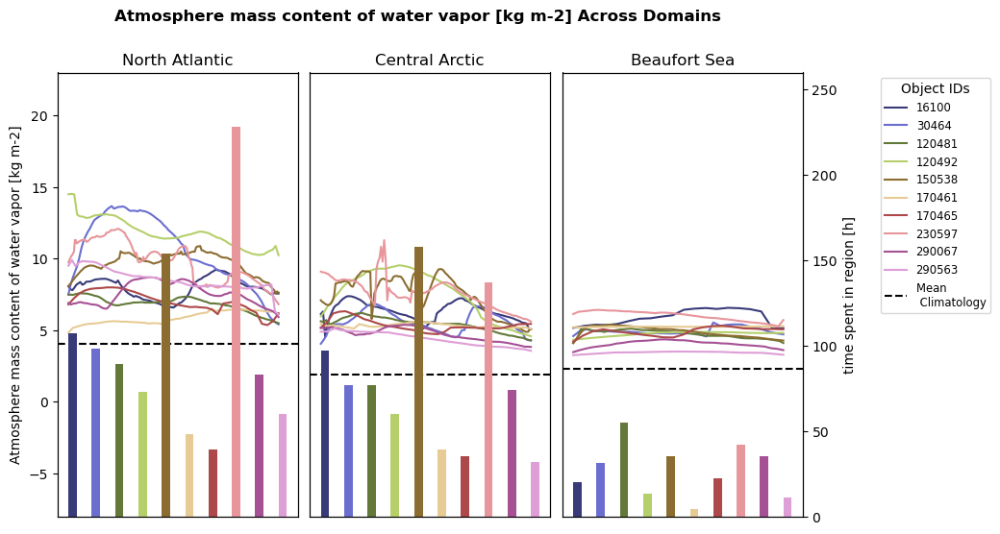

In [82]:
plot_masked_shapes_clim(prw_shape_list[0], prw_shape_list[1], prw_shape_list[2],
                                   prw_clim_list[0]['prw'].mean(dim=("rlat","rlon")),prw_clim_list[1]['prw'].mean(dim=("rlat","rlon")),prw_clim_list[2]['prw'].mean(dim=("rlat","rlon")),
                                   list_ids, f'Atmosphere mass content of water vapor [kg m-2]', f'Atmosphere mass content of water vapor [kg m-2] Across Domains',vmin=-8,vmax=23, savefig = False,clim=True,bars=True)

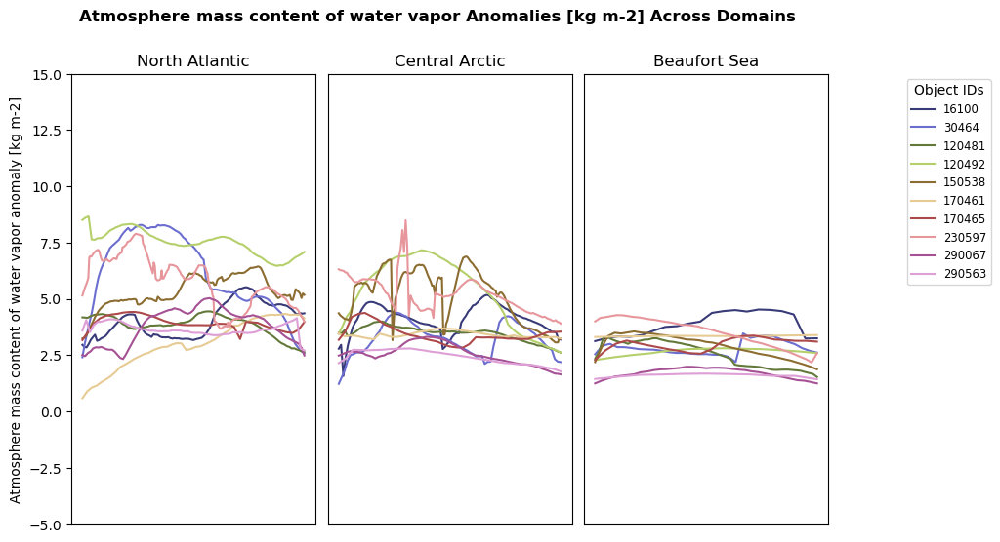

In [84]:
plot_masked_shapes_clim(prw_anomaly_list[0], prw_anomaly_list[1], prw_anomaly_list[2],
                                   prw_clim_list[0]['prw'].mean(dim=("rlat","rlon")),prw_clim_list[1]['prw'].mean(dim=("rlat","rlon")),prw_clim_list[2]['prw'].mean(dim=("rlat","rlon")),
                                   list_ids,f'Atmosphere mass content of water vapor anomaly [kg m-2]', f'Atmosphere mass content of water vapor Anomalies [kg m-2] Across Domains',vmin=-5,vmax=15,bars=False)

#### rlds (ATHD_S)

In [34]:
rlds_shape_list, rlds_clim_list, rlds_anomaly_list = create_and_store_lists('rlds','rlds','',
                                                                        domains,ICON_NorESM_path,ICON_clim_path,
                                                                        objs_final,ds_moaap,NESM=True)

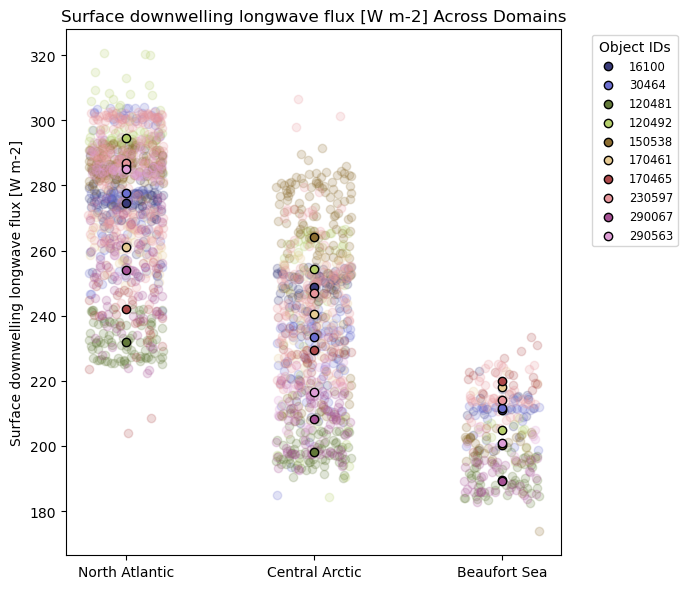

In [87]:
plot_scatter_domains(rlds_shape_list[0], rlds_shape_list[1], rlds_shape_list[2], list_ids, f'Surface downwelling longwave flux [W m-2]',f'Surface downwelling longwave flux [W m-2] Across Domains', savefig = False)

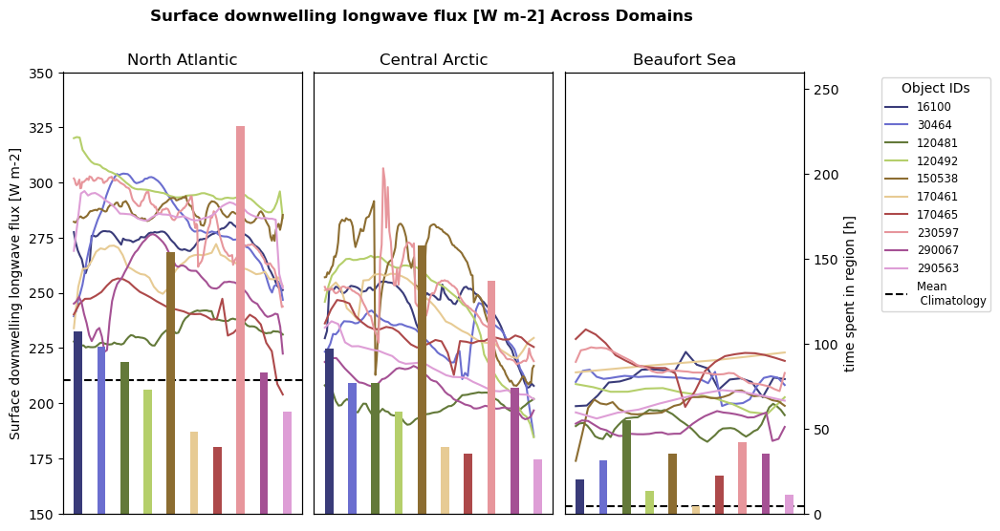

In [88]:
plot_masked_shapes_clim(rlds_shape_list[0], rlds_shape_list[1], rlds_shape_list[2],
                                   rlds_clim_list[0]['rlds'].mean(dim=("rlat","rlon")),rlds_clim_list[1]['rlds'].mean(dim=("rlat","rlon")),rlds_clim_list[2]['rlds'].mean(dim=("rlat","rlon")),
                                   list_ids, f'Surface downwelling longwave flux [W m-2]', f'Surface downwelling longwave flux [W m-2] Across Domains',vmin=150,vmax=350, savefig = False,clim=True,bars=True)

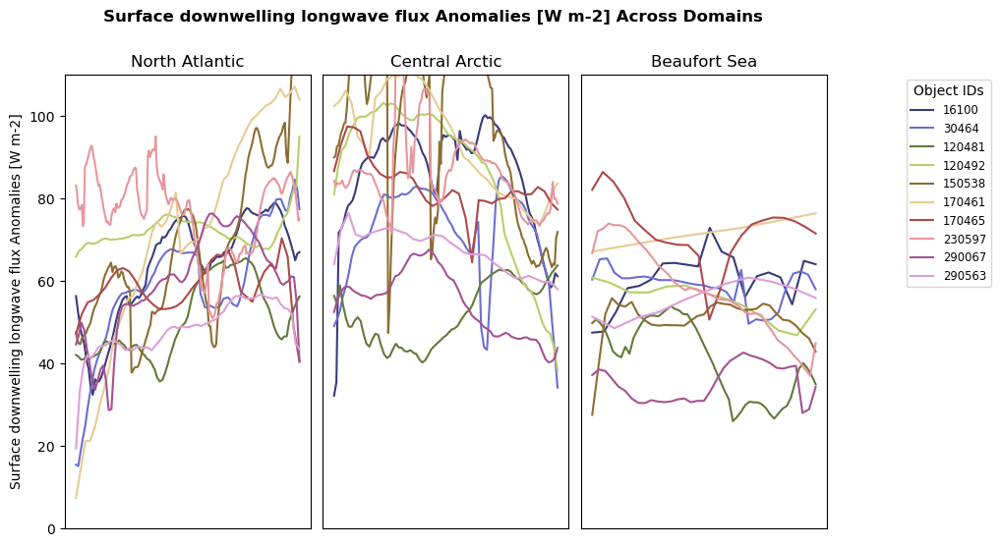

In [90]:
plot_masked_shapes_clim(rlds_anomaly_list[0], rlds_anomaly_list[1], rlds_anomaly_list[2],
                                   rlds_clim_list[0]['rlds'],rlds_clim_list[1]['rlds'],rlds_clim_list[2]['rlds'],
                                   list_ids,f'Surface downwelling longwave flux Anomalies [W m-2]', f'Surface downwelling longwave flux Anomalies [W m-2] Across Domains',vmin=0,vmax=110,bars=False)

#### sfcWind

In [35]:
sfcWind_shape_list, sfcWind_clim_list, sfcWind_anomaly_list = create_and_store_lists('sfcWind','sfcWind','',
                                                                            domains,ICON_NorESM_path,ICON_clim_path,
                                                                           objs_final,ds_moaap,NESM=True)

#### hfls

In [36]:
hfls_shape_list, hfls_clim_list, hfls_anomaly_list = create_and_store_lists('hfls','hfls','',
                                                                            domains,ICON_NorESM_path,ICON_clim_path,
                                                                           objs_final,ds_moaap,NESM=True)

#### hfss

In [37]:
hfss_shape_list, hfss_clim_list, hfss_anomaly_list = create_and_store_lists('hfss','hfss','',
                                                                            domains,ICON_NorESM_path,ICON_clim_path,
                                                                            objs_final,ds_moaap,NESM=True)

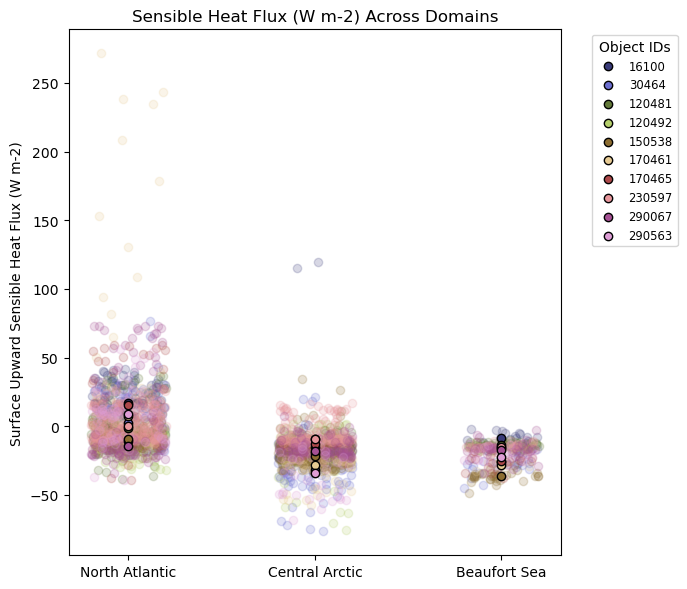

In [40]:
plot_scatter_domains(hfss_shape_list[0], hfss_shape_list[1], hfss_shape_list[2], list_ids, 
                     f'Surface Upward Sensible Heat Flux (W m-2)',f'Sensible Heat Flux (W m-2) Across Domains', savefig = False)

#### pr

In [41]:
pr_shape_list, pr_clim_list, pr_anomaly_list = create_and_store_lists('pr','pr','',
                                                                      domains,ICON_NorESM_path,ICON_clim_path,
                                                                      objs_final,ds_moaap,NESM=True) #*3600

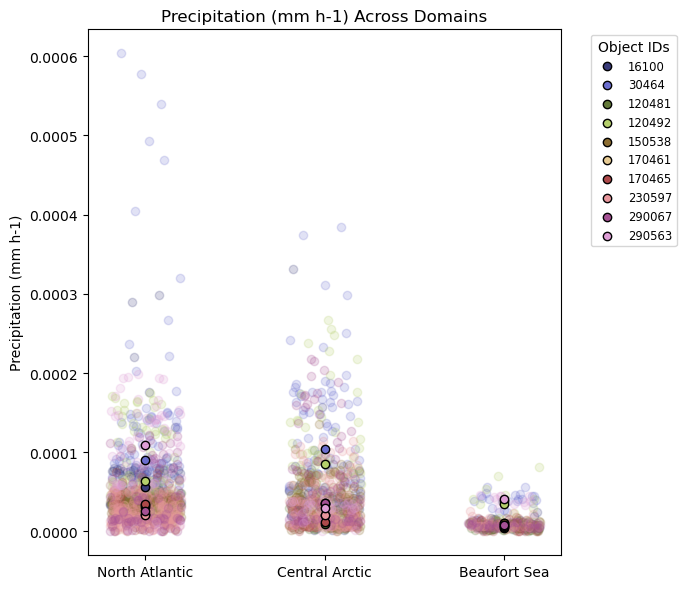

In [42]:
plot_scatter_domains(pr_shape_list[0], pr_shape_list[1], pr_shape_list[2], list_ids, 
                     f'Precipitation (mm h-1)',f'Precipitation (mm h-1) Across Domains', savefig = False)

#### clwvi

In [43]:
clwvi_shape_list, clwvi_clim_list, clwvi_anomaly_list = create_and_store_lists('clwvi','clwvi','',
                                                                            domains,ICON_NorESM_path,ICON_clim_path,
                                                                           objs_final,ds_moaap,NESM=True)

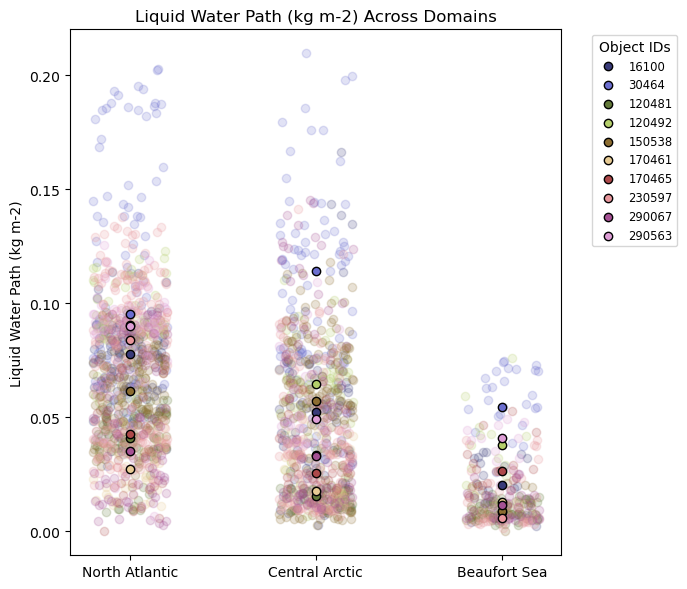

In [44]:
plot_scatter_domains(clwvi_shape_list[0], clwvi_shape_list[1], clwvi_shape_list[2], list_ids, 
                     f'Liquid Water Path (kg m-2)',f'Liquid Water Path (kg m-2) Across Domains', savefig = False)

#### clivi

In [45]:
clivi_shape_list, clivi_clim_list, clivi_anomaly_list = create_and_store_lists('clivi','clivi','',
                                                                            domains,ICON_NorESM_path,ICON_clim_path,
                                                                           objs_final,ds_moaap,NESM=True)

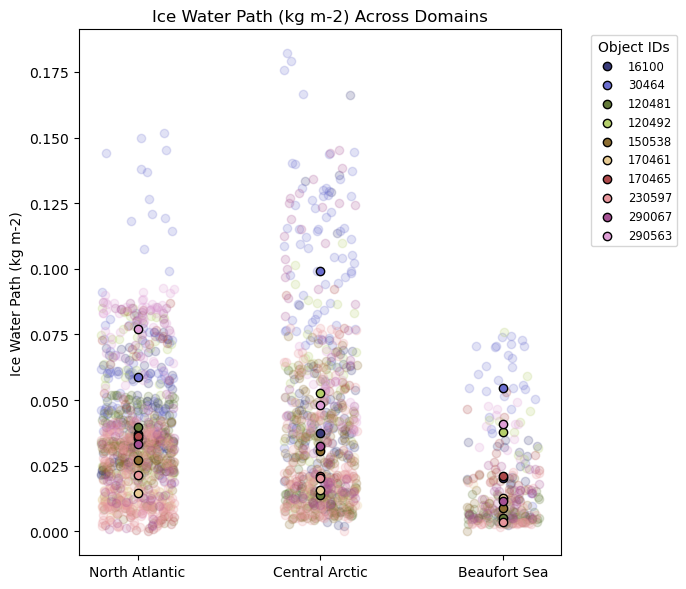

In [46]:
plot_scatter_domains(clivi_shape_list[0], clivi_shape_list[1], clivi_shape_list[2], list_ids, 
                     f'Ice Water Path (kg m-2)',f'Ice Water Path (kg m-2) Across Domains', savefig = False)

### Animations

In [34]:
df_objs

,id,color
0,1,"(0.2235294117647059, 0.23137254901960785, 0.47..."
1,2,"(0.2235294117647059, 0.23137254901960785, 0.47..."
2,3,"(0.2235294117647059, 0.23137254901960785, 0.47..."
3,4,"(0.2235294117647059, 0.23137254901960785, 0.47..."
4,5,"(0.2235294117647059, 0.23137254901960785, 0.47..."
...,...,...
8944,296176,"(0.8705882352941177, 0.6196078431372549, 0.839..."
8945,296177,"(0.8705882352941177, 0.6196078431372549, 0.839..."
8946,296178,"(0.8705882352941177, 0.6196078431372549, 0.839..."
8947,296179,"(0.8705882352941177, 0.6196078431372549, 0.839..."


In [19]:
# could be modified to a simpler version at the beginning, later use this as base 

# Define the plotting function
def moaap_object_plot(tt,ds_moaap,df_objs,objs,save_figs=False,show_figs=True):

    fig, ax = plt.subplots(1, 1, subplot_kw={'projection': ccrs.Orthographic(0, 90)})
    
    #ax.set_title(f"Time: {pd.to_datetime(tt.values)}",y=1.05)

    ds_moaap_sel=ds_moaap.sel(time=tt,method='nearest').compute()

    # Plot the IVT
    ds_moaap_sel.IVT.plot(x='rlon',y='rlat',ax=ax,vmin=0,vmax=250,cmap='Blues',transform=crs_rot,cbar_kwargs={'extend':'both'})#,'pad':0.01})
    
    
    # Plot the tracked IVT objects with individual colors
    obj_ids_tt=np.unique(ds_moaap_sel.IVT_Objects)
    obj_ids_tt = obj_ids_tt[obj_ids_tt != 0].astype(int)
    
    for obj_id in obj_ids_tt:
        if (df_objs['id'] == str(obj_id)).any():
            obj_color=df_objs[df_objs['id'] == str(obj_id)].color.item() #[df_objs.loc[str(obj_id)].color] 
        else:
            obj_color='b'
            
        if str(obj_id) in objs_plot_ids:
            lw=3

            obj_idx=df_objs[df_objs['id'] == str(obj_id)].index.item() #index of obj_id in the df_objs
            track=objs[obj_idx].track
            track_lats = np.array([x.lat for x in track.values])
            track_lons = np.array([x.lon for x in track.values])
            track_tt=track.sel(times=tt,method='nearest')
            ax.scatter(track_tt.item().lon,track_tt.item().lat,transform=crs_rot,facecolor=[obj_color],edgecolor='k',s=20)
            ax.plot(track_lons,track_lats,color=obj_color,lw=0.75,transform=crs_rot,zorder=8) 
            ax.text(track_lons[-1],track_lats[-1],obj_id,transform=crs_rot,color=obj_color,zorder=11)

        else:
            lw=1
            

        
        (ds_moaap_sel.IVT_Objects==obj_id).plot.contour(x='rlon',y='rlat',ax=ax,levels=1,colors=[obj_color],linewidths=lw,transform=crs_rot,zorder=10)
    
    
    ax.set_title(f"Time: {pd.to_datetime(tt.values)}",y=1.0)
    ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    ax.gridlines(linestyle='--',zorder=3)
    ax.coastlines(zorder=2)
    ax.add_feature(cartopy.feature.LAND, color='lightgray',alpha=0.8,zorder=0, edgecolor='black') 
    ax.add_feature(cartopy.feature.OCEAN, color='white',zorder=0, edgecolor='None')
    
    ax.set_aspect('equal')
    center, radius = [0.5, 0.5], 0.55
    circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)), np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    fig.suptitle(f"Time: {pd.to_datetime(tt.values)}", y=1, fontsize=14)


    for domain_name, domain_data in mask_domains.items():
        domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1.5,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())

    if show_figs==True:
        #plt.tight_layout()
        plt.show()
        
    if save_figs==True: 
        path_input_images='ICON_NorESM/'
        path_movies='/work/aa0049/a271122/scripts/movies/'
        plt.tight_layout()
        plt.savefig(path_movies + path_input_images + f"{pd.to_datetime(tt.values).strftime('%Y-%m-%dT%H-%M')}.jpg",dpi=300,transparent=True)
        #plt.show()


In [ ]:
## Example: plot one object (

objs_plot_ids = [objs_final[2]['id_'].item()]#['1220835'] # ids_sel # ['1220826','1220835'] #['1030505','1036731']  # list of selected object IDs
# MOSAiC 2020-04 cases: ['1220826','1220835']

objs_plot_times = xr.concat(
    [obj.times for obj in objs if obj.id_.item() in objs_plot_ids],
    dim='times').sortby('times').drop_duplicates(dim='times')

for tt in objs_plot_times[::24]:

    moaap_object_plot(tt,ds_moaap,df_objs,objs,save_figs=False,show_figs=True)

In [ ]:
#all historical objects

for i in range(len(objs_final)): 

    objs_plot_ids = [objs_final[i]['id_'].item()]
    
    objs_plot_times = xr.concat(
        [obj.times for obj in objs if obj.id_.item() in objs_plot_ids],
        dim='times').sortby('times').drop_duplicates(dim='times')
    
    for tt in objs_plot_times[::6]:
    
        moaap_object_plot(tt,ds_moaap,df_objs,objs,save_figs=True,show_figs=False)

In [ ]:
#all projection objects

for i in range(len(objs_final_ssp)): 

    objs_plot_ids = [objs_final_ssp[i]['id_'].item()]
    
    objs_plot_times = xr.concat(
        [obj.times for obj in objs_ssp if obj.id_.item() in objs_plot_ids],
        dim='times').sortby('times').drop_duplicates(dim='times')
    
    for tt in objs_plot_times[::6]:
    
        moaap_object_plot(tt,ds_moaap_ssp,df_objs_ssp,objs_ssp,save_figs=True,show_figs=False)

In [40]:
from moviepy.video.io.ImageSequenceClip import ImageSequenceClip

In [75]:
### Make Animations from individual plots
#Requires all images to be in the path_input_images already
path_input_images='ICON_NorESM/'
path_movies='/work/aa0049/a271122/scripts/movies/'

# Set the path to images
image_folder = path_movies+path_input_images
video_name = 'movie_features_MOAAP_ICON_NorESM_deepWAIS_DJF.mp4'

# Get sorted list of image paths
images = sorted([os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(".jpg")])

# Create video clip
clip = ImageSequenceClip(images, fps=2)
clip.write_videofile(image_folder+video_name, codec="libx264")



MoviePy - Building video /work/aa0049/a271122/scripts/movies/ICON_NorESM/movie_features_MOAAP_ICON_NorESM_deepWAIS_DJF.mp4.
MoviePy - Writing video /work/aa0049/a271122/scripts/movies/ICON_NorESM/movie_features_MOAAP_ICON_NorESM_deepWAIS_DJF.mp4



MoviePy - Done !
MoviePy - video ready /work/aa0049/a271122/scripts/movies/ICON_NorESM/movie_features_MOAAP_ICON_NorESM_deepWAIS_DJF.mp4


In [19]:
def add_custom_colorbar(mappable, ax, ds, var_):

    standard_name = ds[var_].attrs.get('standard_name', var_)
    units = ds[var_].attrs.get('units', '')
    cbar = plt.colorbar(mappable, ax=ax, orientation='vertical', pad=0.08, shrink=0.8, extend='both')
    cbar.set_label(f'{var_} [{units}]', fontsize=12)
    cbar.ax.tick_params(labelsize=12)

In [30]:

def plot_subplot_anomalies(k,tt, variables, variable_names,
                           variable_cmaps, ds_moaap, df_objs, objs,
                           objs_plot_ids, crs_rot,sea_ice_edge, years,mask_domains=None,savefig=False,ssp=True):
    """
    Create a 2x3 subplot of IVT and other variables at time `tt`.

    Parameters:
        tt: datetime-like object
        variables: list of 6 variable folder names (first one should be 'IVT')
        variable_names: list of 6 variable data names in the NetCDF files
        variable_cmaps: list of 6 colormaps for plotting
        enddate: string, end date for loading variable files
        ds_moaap: main dataset with IVT and object tracking
        df_objs: dataframe with object info (id, color)
        objs: list of object data (with track, speed, etc.)
        objs_plot_ids: list of object ids to highlight
        crs_rot: rotated pole CRS
        mask_domains: dict of domains with masks and colors (optional)
    """
    fig, axs = plt.subplots(2, 3, figsize=(18, 10),
                            subplot_kw={'projection': ccrs.Orthographic(0, 90)})
    axs = axs.flatten()


    vmin_vmax_dict = {
        'psl': (-1500, 1500),
        'tas': (-12, 12),
        'pr': (-0.1, 0.1),
        'tcc': (-20, 20),
        'hcc': (-20, 20),
        'mcc': (-20, 20),
        'lcc': (-20, 20),
        'rlds':(-65, 65),
        'hfls':(-65, 65),
        'hfss':(-65, 65),
        'sic': (0, 100)
    }

    for i in range(6):
        ax = axs[i]
        ax.clear()
        ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
        ax.gridlines(linestyle='--', zorder=3)
        ax.coastlines(zorder=2)
        ax.add_feature(cartopy.feature.LAND, color='lightgray', alpha=1, zorder=0, edgecolor='black')
        ax.add_feature(cartopy.feature.OCEAN, color='white', zorder=0, edgecolor='black')
        fig.suptitle(f'Transarctic WAIs (IVT Objects) and large-scale features for ICON-NorESM DJF | {pd.to_datetime(tt.values)}',fontweight='bold',y=1) #,ha='right' 
        
        # Clip to circle
        center, radius = [0.5, 0.5], 0.55
        circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                                       np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
        ax.set_boundary(circle, transform=ax.transAxes)

        if i == 0:
            # Plot IVT
            ds_moaap_sel = ds_moaap.sel(time=tt, method='nearest').compute()
            ds_IVT = ds_moaap_sel.IVT.plot(x='rlon', y='rlat', ax=ax, vmin=0, vmax=250,
                cmap=variable_cmaps[i], transform=crs_rot,add_colorbar=False)

            cbar = plt.colorbar(ds_IVT, ax=ax, orientation='vertical', pad=0.08, shrink=0.8, extend='both')
            cbar.set_label('IVT [kg m-1 s-1]', fontsize=10)
            cbar.ax.tick_params(labelsize=10)
        else:
            # Plot climate variable
            var = variables[i]
            var_ = variable_names[i]

            # Default padding between colorbar and map
            vmin, vmax = vmin_vmax_dict.get(var, (None, None))
            
            ds = xr.open_mfdataset(f'{ICON_NorESM_path_ssp}{var}/v20250601/{var}_*.nc',chunks = {'time':10})
            if ssp:
                ds_clim = xr.open_dataset(f'{ICON_clim_path}/ssp/clim/{var}/{var}_clim_day_DJF_ssp_{years}.nc',chunks={'time': 10})
            else: 
                ds_clim = xr.open_dataset(f'{ICON_clim_path}/clim/{var}/{var}_clim_day_DJF.nc',chunks={'time': 10})

            #Compute anomaly
            tt_dt = pd.to_datetime(tt.values)
            month = tt_dt.month
            day = tt_dt.day
            month_day_str = f"{month:02d}-{day:02d}"
            
            
            var_tot = ds[var_].sel(time=tt, method='nearest')
            
            var_clim = ds_clim[var_].sel(time=ds_clim.time.dt.strftime('%m-%d') == month_day_str)
            
            var_anom = var_tot - var_clim

            var_anom_plot = var_anom.plot(ax=ax, cmap=variable_cmaps[i], transform=crs_rot,vmin=vmin,vmax=vmax,add_colorbar=False)

            add_custom_colorbar(var_anom_plot, ax, ds, var_)

        # Plot tracked objects
        ds_moaap_sel = ds_moaap.sel(time=tt, method='nearest').compute()
        obj_ids_tt = np.unique(ds_moaap_sel.IVT_Objects)
        obj_ids_tt = obj_ids_tt[obj_ids_tt != 0].astype(int)

        for obj_id in obj_ids_tt:
            if (df_objs['id'] == str(obj_id)).any():
                obj_color = df_objs[df_objs['id'] == str(obj_id)].color.item()
            else:
                obj_color = 'b'

            lw = 3 if str(obj_id) in objs_plot_ids else 1

            if str(obj_id) in objs_plot_ids:
                obj_idx = df_objs[df_objs['id'] == str(obj_id)].index.item()
                track = objs[obj_idx].track
                track_lats = np.array([x.lat for x in track.values])
                track_lons = np.array([x.lon for x in track.values])
                track_tt = track.sel(times=tt, method='nearest')
                ax.scatter(track_tt.item().lon, track_tt.item().lat, transform=crs_rot,
                           facecolor=[obj_color], edgecolor='k', s=20)
                
                # Ensure longitudes are in -180 to 180 range
                #track_lons = ((track_lons + 180) % 360) - 180

                ax.plot(track_lons, track_lats, color=obj_color, lw=0.75, transform=crs_rot, zorder=15) #track
                ax.text(track_lons[-1], track_lats[-1], obj_id, transform=crs_rot, color=obj_color, zorder=11)

            (ds_moaap_sel.IVT_Objects == obj_id).plot.contour(x='rlon', y='rlat', ax=ax, levels=1,
                                                              colors=[obj_color], linewidths=lw,
                                                              transform=crs_rot, zorder=5)

        #Add sea ice
        sea_ice_edge.plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'cyan', linewidths = 1, linestyles = '-',zorder=1)


        # Optional domain outlines
        if mask_domains:
            for domain_name, domain_data in mask_domains.items():
                domain_data["mask"].plot.contour(levels=1, colors=domain_data["color"],
                                                 linewidths=1.5, linestyles='--',
                                                 zorder=4, ax=ax, transform=ccrs.PlateCarree())

        if i == 0: 
            ax.set_title("IVT", y=1.05)
        else: 
            ax.set_title(f"{variables[i]} Anomalies", y=1.05)

    if savefig==True:
        path_input_images='ICON_NorESM/'
        path_movies='/work/aa0049/a271122/scripts/movies/'
        plt.savefig(path_movies + path_input_images + f"composite_{k}_{pd.to_datetime(tt.values).strftime('%Y-%m-%dT%H-%M')}.jpg",dpi=300)#,transparent=True)
        plt.close(fig)
        
    #plt.tight_layout()
    #plt.show()


In [ ]:
for i in range(len(objs_final)):
    objs_plot_ids = [objs_final[i]['id_'].item()]#['1220835'] # ids_sel # ['1220826','1220835'] #['1030505','1036731']  # list of selected object IDs
    # MOSAiC 2020-04 cases: ['1220826','1220835']
    
    objs_plot_times = xr.concat(
        [obj.times for obj in objs_final if obj.id_.item() in objs_plot_ids],
        dim='times').sortby('times').drop_duplicates(dim='times')
    
    for tt in objs_plot_times[::6]:
        plot_subplot_anomalies(
            k,
            tt,
            variables=['IVT', 'psl','tas', 'rlds', 'hfls', 'hfss'],
            variable_names=['IVT', 'psl', 'tas', 'rlds', 'hfls', 'hfss'],
            variable_cmaps=['Blues', 'RdBu_r', 'RdBu_r', 'RdBu_r', 'RdBu_r', 'RdBu_r'],
            ds_moaap=ds_moaap,
            df_objs=df_objs,
            objs=objs,
            objs_plot_ids=objs_plot_ids,
            crs_rot=crs_rot,
            years=None,
            mask_domains=mask_domains,
            savefig = True, 
            ssp=False
        )

#### SSP

In [54]:
ds_ice_ssp = xr.open_mfdataset('/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/mon/siconca/v20250601/siconca_ARC-12_NorESM2-MM_ssp370_r1i1p1f1_CLMcom-AWI_ICON-CLM-202401-1-1_v1-r1_mon_*.nc',decode_times=False,chunks = {'time':10})
# Replace this if time is a coordinate
months_since_1950 = ds_ice_ssp['time'].values
ds_ice_ssp['time'] = pd.date_range(start='2015-01-01', periods=len(months_since_1950), freq='MS')


ds_ice_ssp =ds_ice_ssp.sel(time=slice("2015-01-01","2039-12-31"))

siconc_mean_ssp= ds_ice_ssp.siconca.sel(time=ds_ice_ssp.siconca.time.dt.month.isin([12, 1, 2])).mean(dim='time') #Winter sea ice


In [ ]:
for k in range(0,10):
    objs_plot_ids = [objs_final_ssp[k]['id_'].item()]#['1220835'] # ids_sel # ['1220826','1220835'] #['1030505','1036731']  # list of selected object IDs
    # MOSAiC 2020-04 cases: ['1220826','1220835']
    
    objs_plot_times = xr.concat(
        [obj.times for obj in objs_final_ssp if obj.id_.item() in objs_plot_ids],
        dim='times').sortby('times').drop_duplicates(dim='times')
    
    for tt in objs_plot_times[::6]:
        plot_subplot_anomalies(
            k,
            tt,
            variables=['IVT', 'psl','tas', 'rlds', 'hfls', 'hfss'],
            variable_names=['IVT', 'psl', 'tas', 'rlds', 'hfls', 'hfss'],
            variable_cmaps=['Blues', 'RdBu_r', 'RdBu_r', 'RdBu_r', 'RdBu_r', 'RdBu_r'],
            ds_moaap=ds_moaap_ssp,
            df_objs=df_objs_ssp,
            objs=objs_final_ssp,
            objs_plot_ids=objs_plot_ids,
            crs_rot=crs_rot,
            sea_ice_edge = siconc_mean_ssp ,
            years = '15-39',
            mask_domains=mask_domains,
            savefig = True
        )

In [25]:
ds_ice_ssp = xr.open_mfdataset('/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/mon/siconca/v20250601/siconca_ARC-12_NorESM2-MM_ssp370_r1i1p1f1_CLMcom-AWI_ICON-CLM-202401-1-1_v1-r1_mon_*.nc',decode_times=False,chunks = {'time':10})
# Replace this if time is a coordinate
months_since_1950 = ds_ice_ssp['time'].values
ds_ice_ssp['time'] = pd.date_range(start='2015-01-01', periods=len(months_since_1950), freq='MS')


ds_ice_ssp =ds_ice_ssp.sel(time=slice("2040-01-01","2069-12-31"))

siconc_mean_ssp_40= ds_ice_ssp.siconca.sel(time=ds_ice_ssp.siconca.time.dt.month.isin([12, 1, 2])).mean(dim='time') #Winter sea ice


In [ ]:
for k in range(10,15):
    objs_plot_ids = [objs_final_ssp[k]['id_'].item()]#['1220835'] # ids_sel # ['1220826','1220835'] #['1030505','1036731']  # list of selected object IDs
    # MOSAiC 2020-04 cases: ['1220826','1220835']
    
    objs_plot_times = xr.concat(
        [obj.times for obj in objs_final_ssp if obj.id_.item() in objs_plot_ids],
        dim='times').sortby('times').drop_duplicates(dim='times')
    
    for tt in objs_plot_times[::6]:
        plot_subplot_anomalies(
            k,
            tt,
            variables=['IVT', 'psl','tas', 'rlds', 'hfls', 'hfss'],
            variable_names=['IVT', 'psl', 'tas', 'rlds', 'hfls', 'hfss'],
            variable_cmaps=['Blues', 'RdBu_r', 'RdBu_r', 'RdBu_r', 'RdBu_r', 'RdBu_r'],
            ds_moaap=ds_moaap_ssp,
            df_objs=df_objs_ssp,
            objs=objs_final_ssp,
            objs_plot_ids=objs_plot_ids,
            crs_rot=crs_rot,
            sea_ice_edge = siconc_mean_ssp_40,
            years='40-69',
            mask_domains=mask_domains,
            savefig = True
        )

In [27]:
ds_ice_ssp = xr.open_mfdataset('/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/mon/siconca/v20250601/siconca_ARC-12_NorESM2-MM_ssp370_r1i1p1f1_CLMcom-AWI_ICON-CLM-202401-1-1_v1-r1_mon_*.nc',decode_times=False,chunks = {'time':10})
# Replace this if time is a coordinate
months_since_1950 = ds_ice_ssp['time'].values
ds_ice_ssp['time'] = pd.date_range(start='2015-01-01', periods=len(months_since_1950), freq='MS')


ds_ice_ssp =ds_ice_ssp.sel(time=slice("2070-01-01","2099-12-31"))

siconc_mean_ssp_70= ds_ice_ssp.siconca.sel(time=ds_ice_ssp.siconca.time.dt.month.isin([12, 1, 2])).mean(dim='time') #Winter sea ice


In [28]:
for k in range(11,13):
   print(objs_final_ssp[k].times[0].values)

2095-01-10T18:00:00.000000000
2097-12-18T23:00:00.000000000


In [ ]:
for k in range(11,13):
    objs_plot_ids = [objs_final_ssp[k]['id_'].item()]#['1220835'] # ids_sel # ['1220826','1220835'] #['1030505','1036731']  # list of selected object IDs
    # MOSAiC 2020-04 cases: ['1220826','1220835']
    
    objs_plot_times = xr.concat(
        [obj.times for obj in objs_final_ssp if obj.id_.item() in objs_plot_ids],
        dim='times').sortby('times').drop_duplicates(dim='times')
    
    for tt in objs_plot_times[::6]:
        plot_subplot_anomalies(
            k,
            tt,
            variables=['IVT', 'psl','tas', 'rlds', 'hfls', 'hfss'],
            variable_names=['IVT', 'psl', 'tas', 'rlds', 'hfls', 'hfss'],
            variable_cmaps=['Blues', 'RdBu_r', 'RdBu_r', 'RdBu_r', 'RdBu_r', 'RdBu_r'],
            ds_moaap=ds_moaap_ssp,
            df_objs=df_objs_ssp,
            objs=objs_final_ssp,
            objs_plot_ids=objs_plot_ids,
            crs_rot=crs_rot,
            sea_ice_edge = siconc_mean_ssp_70,
            years='70-99',
            mask_domains=mask_domains,
            savefig = True
        )

In [41]:
### Make Animations from individual plots
#Requires all images to be in the path_input_images already
path_input_images='ICON_NorESM/'
path_movies='/work/aa0049/a271122/scripts/movies/'

# Set the path to images
image_folder = path_movies+path_input_images
video_name = 'movie_composite_features_MOAAP_ICON_NorESM_deepWAIS_DJF_1984_2099.mp4'

# Get sorted list of image paths
images = sorted([os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(".jpg")])

# Create video clip
clip = ImageSequenceClip(images, fps=2)
clip.write_videofile(image_folder+video_name, codec="libx264")



MoviePy - Building video /work/aa0049/a271122/scripts/movies/ICON_NorESM/movie_composite_features_MOAAP_ICON_NorESM_deepWAIS_DJF_1984_2099.mp4.
MoviePy - Writing video /work/aa0049/a271122/scripts/movies/ICON_NorESM/movie_composite_features_MOAAP_ICON_NorESM_deepWAIS_DJF_1984_2099.mp4



MoviePy - Done !
MoviePy - video ready /work/aa0049/a271122/scripts/movies/ICON_NorESM/movie_composite_features_MOAAP_ICON_NorESM_deepWAIS_DJF_1984_2099.mp4


### Stats

In [16]:
##Calculate total track length for a given track
def calculate_track_length_geopy(track_lats, track_lons):
    total_distance = 0.0
    for i in range(len(track_lats) - 1):
        point1 = (track_lats[i], track_lons[i]) 
        point2 = (track_lats[i + 1], track_lons[i + 1])
        total_distance += distance(point1, point2).km
    return total_distance


In [29]:
objs_final[0].id_.item()

'16100'

In [30]:
objs_final[0].times.dt.year[0].item()

1985

In [31]:
duration = []
track_length = []
id_ = []
year = []
# For each WAIs in objs_final:
for i in range(len(objs_final)): 
    
    #Calculate duration 
    duration.append(len(objs_final[i].times))

    #Calculate length 
    track=objs_final[i].track.values
        
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track]) 

    tot_distance = calculate_track_length_geopy(track_lats,track_lons)
    track_length.append(round(tot_distance,2))


    # Save id
    id_.append(objs_final[i].id_.item())
    
    #Save year
    year.append(objs_final[i].times.dt.year[0].item())


data_NorESM = {'ID': id_,
              'Year': year,
              'Duration (h)': duration,
              'Length (km)': track_length}


In [110]:
df_ICON_NorESM = pd.DataFrame(data_NorESM)

In [111]:
#Create dataframe with id (xxxxxx) | date (YY) | duration (h) | length (km) 
df_ICON_NorESM


,ID,Year,Duration (h),Length (km)
0,16100,1985,129,7535.10
1,30464,1987,124,7511.09
2,120481,1996,145,7284.80
3,120492,1996,92,4960.46
4,150538,1999,198,9476.09
5,170461,2001,65,3836.22
6,170465,2001,76,5032.11
7,230597,2007,270,13919.31
8,290067,2013,145,7120.71
9,290563,2013,87,4939.99


In [17]:
duration_ssp = []
track_length_ssp = []
id__ssp = []
year_ssp = []
# For each WAIs in objs_final:
for i in range(len(objs_final_ssp)): 
    
    #Calculate duration 
    duration_ssp.append(len(objs_final_ssp[i].times))

    #Calculate length 
    track=objs_final_ssp[i].track.values
        
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track]) 

    tot_distance = calculate_track_length_geopy(track_lats,track_lons)
    track_length_ssp.append(round(tot_distance,2))


    # Save id
    id__ssp.append(objs_final_ssp[i].id_.item())
    
    #Save year
    year_ssp.append(objs_final_ssp[i].times.dt.year[0].item())


data_NorESM_ssp = {'ID': id__ssp,
              'Year': year_ssp,
              'Duration (h)': duration_ssp,
              'Length (km)': track_length_ssp}


In [122]:
df_ICON_NorESM_ssp = pd.DataFrame(data_NorESM_ssp)

In [125]:
df_ICON_NorESM_ssp

,ID,Year,Duration (h),Length (km)
0,80483,2022,126,7531.82
1,106180,2024,80,3758.26
2,110493,2025,85,5042.63
3,110517,2025,92,4269.40
4,120509,2026,137,8553.66
5,230649,2037,204,12618.18
6,240487,2038,106,4727.25
7,246173,2038,164,8022.11
8,246199,2038,195,13202.09
9,270463,2041,140,8499.29


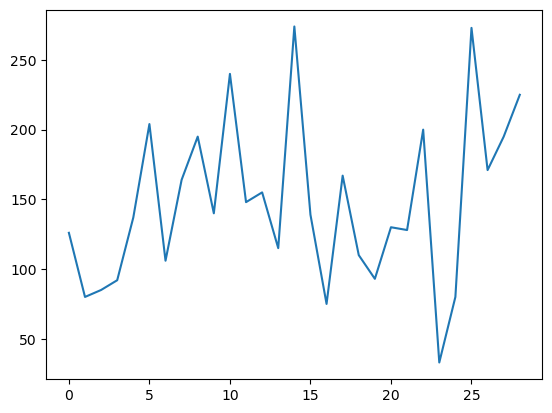

In [126]:
plt.plot(df_ICON_NorESM_ssp['Duration (h)'])

### Test

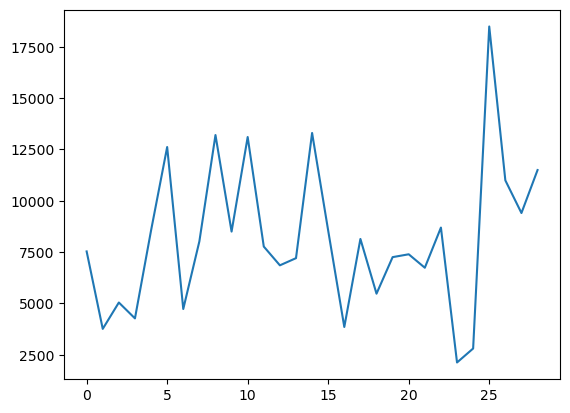

In [128]:
plt.plot(df_ICON_NorESM_ssp['Length (km)'])

In [130]:
df_NorESM_all = pd.concat([df_ICON_NorESM,df_ICON_NorESM_ssp],axis=0)
df_NorESM_all.reset_index(inplace=True,drop=True)
df_NorESM_all

,ID,Year,Duration (h),Length (km)
0,16100,1985,129,7535.10
1,30464,1987,124,7511.09
2,120481,1996,145,7284.80
3,120492,1996,92,4960.46
4,150538,1999,198,9476.09
5,170461,2001,65,3836.22
6,170465,2001,76,5032.11
7,230597,2007,270,13919.31
8,290067,2013,145,7120.71
9,290563,2013,87,4939.99


In [150]:
df_NorESM_all['Duration (h)'].index.values

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38])

In [153]:
df_NorESM_all.index.values

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38])

In [169]:
from scipy.stats import linregress
slope, intercept, r_value, p_value, std_err = linregress(df_NorESM_all.index.values, df_NorESM_all['Duration (h)'])

print(f"y = {round(slope,2)} x + {round(intercept,2)}")


y = 1.07 x + 123.57


In [170]:
print(f"Linear R²: {r_value**2}")

Linear R²: 0.04096583906100555


In [156]:

df_NorESM_all.index.values

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38])

In [157]:
df_NorESM_all['Year']

0     1985
1     1987
2     1996
3     1996
4     1999
5     2001
6     2001
7     2007
8     2013
9     2013
10    2022
11    2024
12    2025
13    2025
14    2026
15    2037
16    2038
17    2038
18    2038
19    2041
20    2043
21    2049
22    2053
23    2054
24    2062
25    2070
26    2070
27    2071
28    2074
29    2080
30    2083
31    2086
32    2088
33    2090
34    2092
35    2094
36    2095
37    2096
38    2097
Name: Year, dtype: int64

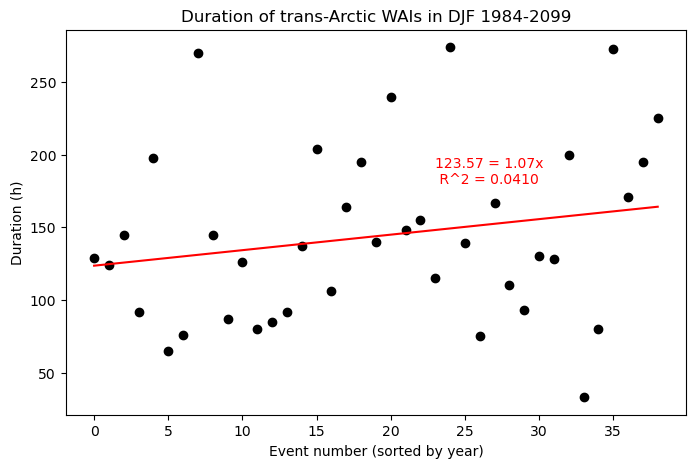

In [174]:
fig,ax = plt.subplots(1,1,figsize=(8,5))
plt.scatter(x=df_NorESM_all.index.values,y=df_NorESM_all['Duration (h)'],color='k')
plt.plot(intercept + slope*df_NorESM_all.index.values,'r',label='linear fit')
plt.text(23,180,f"{intercept:.2f} = {slope:.2f}x  \n R^2 = {r_value**2:.4f}",color='r')

plt.xlabel('Event number (sorted by year)')
plt.ylabel('Duration (h)')
plt.title('Duration of trans-Arctic WAIs in DJF 1984-2099')

plt.show()

In [175]:
slope, intercept, r_value, p_value, std_err = linregress(df_NorESM_all.index.values, df_NorESM_all['Length (km)'])

print(f"Linear R²: {round(r_value**2,4)}")
print(f"y = {round(slope,2)} x + {round(intercept,2)}")

Linear R²: 0.0379
y = 59.51 x + 6753.03


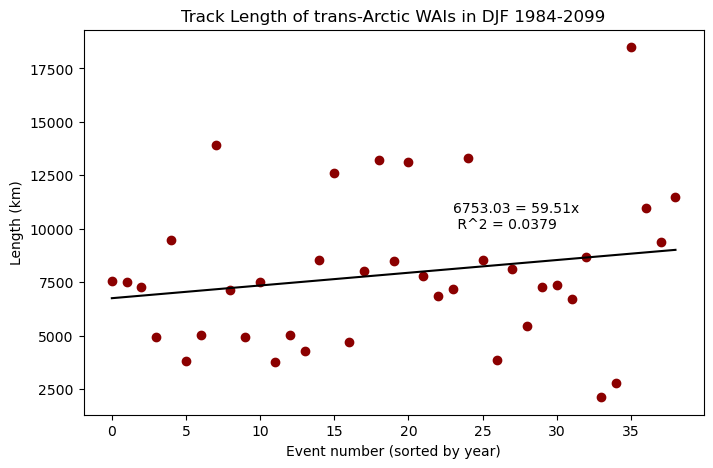

In [177]:
fig,ax = plt.subplots(1,1,figsize=(8,5))
plt.scatter(x=df_NorESM_all.index.values,y=df_NorESM_all['Length (km)'],color='darkred')
plt.plot(intercept + slope*df_NorESM_all.index.values,'k',label='linear fit')
plt.text(23,10000,f"{intercept:.2f} = {slope:.2f}x  \n R^2 = {r_value**2:.4f}",color='k')

plt.xlabel('Event number (sorted by year)')
plt.ylabel('Length (km)')
plt.title('Track Length of trans-Arctic WAIs in DJF 1984-2099')

plt.show()

In [31]:
total_area_list = []
time_list = []
id_list = []
for i in range(len(objs_final)): 
    
    objs_plot_ids = [objs_final[i]['id_'].item()]
    objs_plot_times = xr.concat(
        [obj.times for obj in objs if obj.id_.item() in objs_plot_ids],
        dim='times').sortby('times').drop_duplicates(dim='times')
    total_area_km2 = calculate_total_area(objs_plot_ids,objs_plot_times,ds_moaap,crs_rot)


    total_area_list.append(total_area_km2)
    print(str(objs_plot_ids)+": "+str(total_area_km2)+' km2')
    
    time_list.append(np.datetime_as_string(objs_final[i].times[0].values))
    id_list.append(objs_plot_ids)

['16100']: 6172471.451532489 km2
['30464']: 7365275.511442363 km2
['120481']: 5870917.084286407 km2
['120492']: 3299831.518332958 km2
['150538']: 7672941.632370319 km2
['170461']: 1424589.4001325606 km2
['170465']: 3200897.7561581386 km2
['230597']: 10534738.941296807 km2
['290067']: 5764095.566933469 km2
['290563']: 2768589.2320276713 km2


In [ ]:
ICON_NorESM_MOAAP_values = {"date": time_list, 
                    "id_": id_list,
                    "area": total_area_list}


df_ICON_NorESM_MOAAP = pd.DataFrame(ICON_NorESM_MOAAP_values)

In [32]:
df_ICON_NorESM_MOAAP = pd.read_csv('/work/aa0049/a271122/ICON_NorESM/df_ICON_NorESM_MOAAP.csv')

In [34]:
duration

[129, 124, 145, 92, 198, 65, 76, 270, 145, 87]

In [35]:
df_ICON_NorESM_MOAAP['duration (h)'] = duration

In [37]:
df_ICON_NorESM_MOAAP['Length (km)'] = track_length


In [39]:
df_ICON_NorESM_MOAAP = df_ICON_NorESM_MOAAP.drop('Unnamed: 0',axis = 'columns')

In [40]:
df_ICON_NorESM_MOAAP 

,date,id_,area,duration (h),Length (km)
0,1985-12-23T11:00:00.000000000,['16100'],6.172471e+06,129,7535.10
1,1987-02-14T09:00:00.000000000,['30464'],7.365276e+06,124,7511.09
2,1996-02-01T00:00:00.000000000,['120481'],5.870917e+06,145,7284.80
3,1996-02-10T18:00:00.000000000,['120492'],3.299832e+06,92,4960.46
4,1999-02-26T20:00:00.000000000,['150538'],7.672942e+06,198,9476.09
5,2001-01-08T08:00:00.000000000,['170461'],1.424589e+06,65,3836.22
6,2001-01-08T21:00:00.000000000,['170465'],3.200898e+06,76,5032.11
7,2007-02-16T10:00:00.000000000,['230597'],1.053474e+07,270,13919.31
8,2013-02-15T20:00:00.000000000,['290067'],5.764096e+06,145,7120.71
9,2013-02-19T09:00:00.000000000,['290563'],2.768589e+06,87,4939.99


In [41]:
df_ICON_NorESM_MOAAP.to_csv('/work/aa0049/a271122/ICON_NorESM/df_ICON_NorESM_MOAAP.csv')

#### SSP

In [ ]:
total_area_list_ssp = []
time_list_ssp = []
id_list_ssp = []
for i in range(len(objs_final_ssp)): 
    
    objs_plot_ids = [objs_final_ssp[i]['id_'].item()]
    objs_plot_times = xr.concat(
        [obj.times for obj in objs_ssp if obj.id_.item() in objs_plot_ids],
        dim='times').sortby('times').drop_duplicates(dim='times')
    total_area_km2 = calculate_total_area(objs_plot_ids,objs_plot_times,ds_moaap_ssp,crs_rot)


    total_area_list_ssp.append(total_area_km2)
    print(str(objs_plot_ids)+": "+str(total_area_km2)+' km2')
    
    time_list_ssp.append(np.datetime_as_string(objs_final_ssp[i].times[0].values))
    id_list_ssp.append(objs_plot_ids)

['80483']: 5804863.5193692185 km2
['106180']: 2267585.4022867745 km2
['110493']: 3472856.912534195 km2
['110517']: 3182031.0663366923 km2
['120509']: 7971092.5734761115 km2
['230649']: 7473811.372754292 km2
['240487']: 3678464.6079807314 km2
['246173']: 7529706.112603253 km2
['246199']: 9011443.01898943 km2
['270463']: 8317056.72225455 km2
['296278']: 10287845.250626521 km2
['350585']: 6603818.535680873 km2
['396358']: 8367747.082750008 km2
['400518']: 7396986.447011951 km2
['480634']: 12675802.739731349 km2
['560444']: 11279774.316704523 km2
['560580']: 2109587.7510775165 km2
['570491']: 5002185.464039836 km2
['600667']: 5748629.931107859 km2
['660395']: 9120661.428827127 km2
['696490']: 10305625.283670085 km2
['720499']: 6310371.9951430475 km2
['746544']: 7025498.686018048 km2
['766470']: 964618.8427001594 km2
['786538']: 1597935.575737455 km2
['800565']: 13894756.64619397 km2
['810499']: 4819229.5469267415 km2
['820686']: 7088372.155908309 km2


In [ ]:
ICON_NorESM_ssp_MOAAP_values = {"date": time_list_ssp, 
                    "id_": id_list_ssp,
                    "area": total_area_list_ssp,
                    'duration (h)': duration_ssp,
                    'Length (km)': track_length_ssp}


df_ICON_NorESM_ssp_MOAAP = pd.DataFrame(ICON_NorESM_ssp_MOAAP_values)


In [ ]:
df_ICON_NorESM_ssp_MOAAP 

In [ ]:
df_ICON_NorESM_ssp_MOAAP.to_csv('/work/aa0049/a271122/ICON_NorESM/df_ICON_NorESM_MOAAP_ssp.csv')

In [131]:
#Load MOAAP shapes for all event timesteps
i=3
domain = "BeaufortSiberianSea"

moaap_sel = ds_moaap.sel(time=objs_final[i].times, method='nearest')
mask = (moaap_sel.IVT_Objects == int(objs_final[i].id_.item()))

#Load variable data for the same timesteps
data_sel = data_out.T_2M.sel(time=objs_final[i].times, method='nearest')

# Align mask with data grid
aligned_mask = mask.astype(int).interp(rlat=data_sel.rlat, rlon=data_sel.rlon, method="nearest")
aligned_mask = aligned_mask > 0

# Apply the mask on the variable data
filtered_data = data_sel.where(aligned_mask)
filtered_data = filtered_data.assign_coords(lon=filtered_data.lon)# + 180) % 360) - 180)


if domain == "BeaufortSiberianSea":
        # Apply domain mask
    filtered_domain = filtered_data.where(
                    ((filtered_data.lat >= mask_domains[domain]["south"]) & (filtered_data.lat <= mask_domains[domain]["north"])) &  ((filtered_data.lon >= mask_domains[domain]["east"]) & (filtered_data.lon <= 180)) |  ((filtered_data.lat >= mask_domains[domain]["south"]) & (filtered_data.lat <= mask_domains[domain]["north"])) & ((filtered_data.lon >= -180) & (filtered_data.lon <= mask_domains[domain]["west"])))       
else: filtered_domain = filtered_data.where((filtered_data.lat>=mask_domains[domain]["south"]) & (filtered_data.lat<=mask_domains[domain]["north"]) & (filtered_data.lon>=mask_domains[domain]["west"]) & (filtered_data.lon<=mask_domains[domain]["east"]))

#Check if filtered_domain has at least min_valid_points
num_valid_points = filtered_domain.count()



